# Data Analysis

In [17]:
# # Remove outliers from 'attendance' using the IQR method
# Q1 = df['attendance'].quantile(0.25)
# Q3 = df['attendance'].quantile(0.75)
# IQR = Q3 - Q1

# # Define bounds
# lower_bound = Q1 - 1.5 * IQR
# upper_bound = Q3 + 1.5 * IQR

# # Filter out outliers
# df_no_outliers = df[(df['attendance'] >= lower_bound) & (df['attendance'] <= upper_bound)]

# print(f"Original rows: {len(df)}, Rows after outlier removal: {len(df_no_outliers)}")

### Yearly Average Distribution of Attendance, Capacity & Occupancy

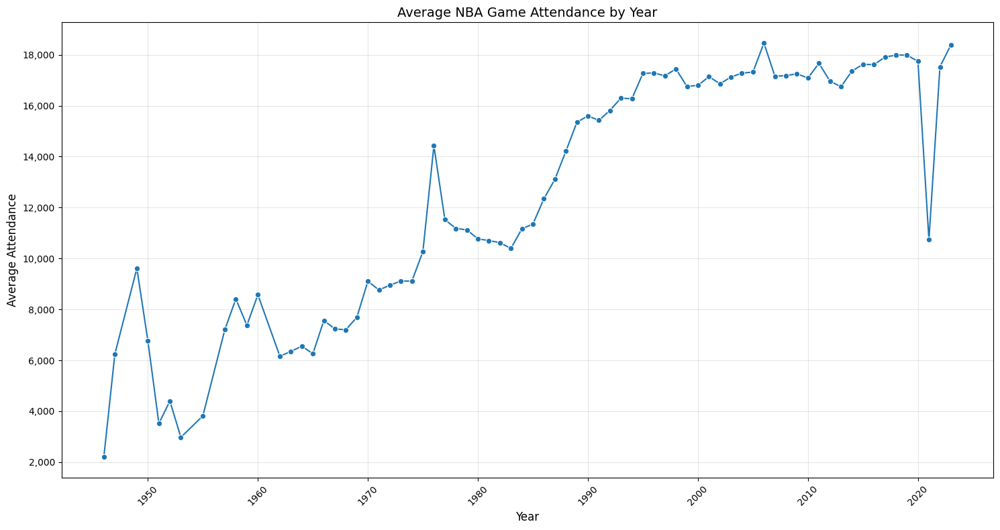


Yearly Attendance Statistics:
              year    attendance
count    78.000000     74.000000
mean   1984.500000  12527.095734
std      22.660538   4800.500681
min    1946.000000   2206.000000
25%    1965.250000   8622.179030
50%    1984.500000  12727.977209
75%    2003.750000  17170.980947
max    2023.000000  18462.522222


In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data
df = pd.read_csv('data/game_info.csv')

# Convert game_date to datetime
df['game_date'] = pd.to_datetime(df['game_date'])

# Extract year from game_date
df['year'] = df['game_date'].dt.year

# Calculate average attendance per year
yearly_attendance = df.groupby('year')['attendance'].mean().reset_index()

# Create the plot
plt.figure(figsize=(15, 8))
sns.lineplot(data=yearly_attendance, x='year', y='attendance', marker='o')

# Customize the plot
plt.title('Average NBA Game Attendance by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Attendance', fontsize=12)
plt.grid(True, alpha=0.3)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add thousands separator to y-axis
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()

# Print some statistics
print("\nYearly Attendance Statistics:")
print(yearly_attendance.describe())

In [19]:
df = pd.read_csv('Master_Short_Data.csv')

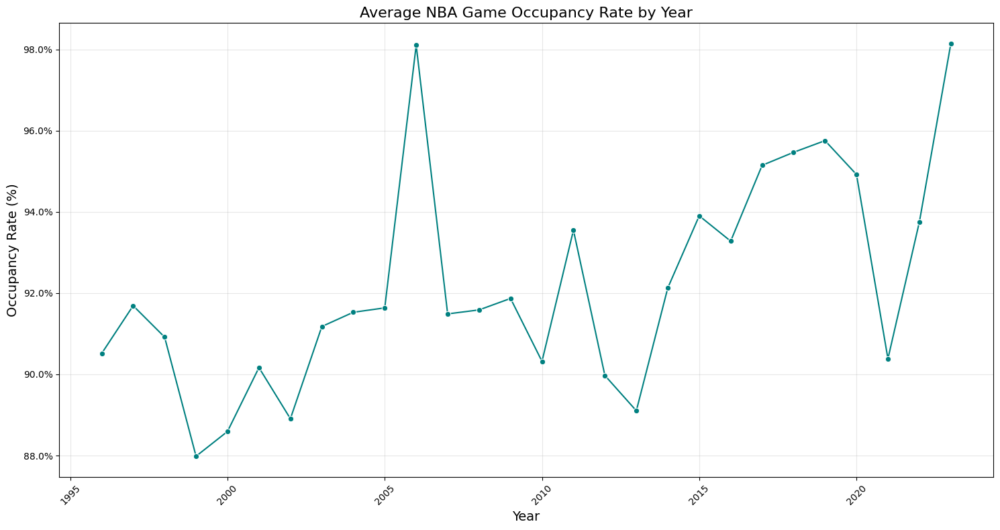


Yearly Occupancy Rate Statistics:
              year  occupancy_rate
count    28.000000       28.000000
mean   2009.500000       92.214996
std       8.225975        2.671883
min    1996.000000       87.982640
25%    2002.750000       90.367635
50%    2009.500000       91.612429
75%    2016.250000       93.792031
max    2023.000000       98.145894


In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the data

# Ensure correct datetime and numeric types
df['game_date'] = pd.to_datetime(df['game_date'], errors='coerce')
df['occupancy_rate'] = pd.to_numeric(df['occupancy_rate'], errors='coerce')

# # Remove rows with missing or zero occupancy_rate
# df = df[df['occupancy_rate'].notnull() & (df['occupancy_rate'] > 0)]

# Extract year from game_date
df['year'] = df['game_date'].dt.year

# Calculate average occupancy per year
yearly_occupancy = df.groupby('year')['occupancy_rate'].mean().reset_index()

# Plotting
plt.figure(figsize=(15, 8))
sns.lineplot(data=yearly_occupancy, x='year', y='occupancy_rate', marker='o', color='teal')

# Customize plot
plt.title('Average NBA Game Occupancy Rate by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Occupancy Rate (%)', fontsize=14)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)

# Format y-axis as percentage
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}%'))

plt.tight_layout()
plt.show()

# Print summary
print("\nYearly Occupancy Rate Statistics:")
print(yearly_occupancy.describe())


In [21]:
# Durchschnittliche occupancy rate ab 2020 berechnen
avg_occupancy_2020 = data[data['game_year'] >= 2021]['occupancy_rate'].mean()
print(f"Durchschnittliche occupancy rate ab 2020: {avg_occupancy_2020:.2f}%")

NameError: name 'data' is not defined

In [ ]:
# Durchschnittliche occupancy rate von 1996 bis 2020 berechnen
occ_1996_2020 = yearly_occupancy[(yearly_occupancy['year'] >= 1996) & (yearly_occupancy['year'] <= 2020)]['occupancy_rate'].mean()
print(f"Durchschnittliche occupancy rate von 1996 bis 2020: {occ_1996_2020:.2f}%")

Durchschnittliche occupancy rate von 1996 bis 2020: 92.05%


### Stadium Capacities

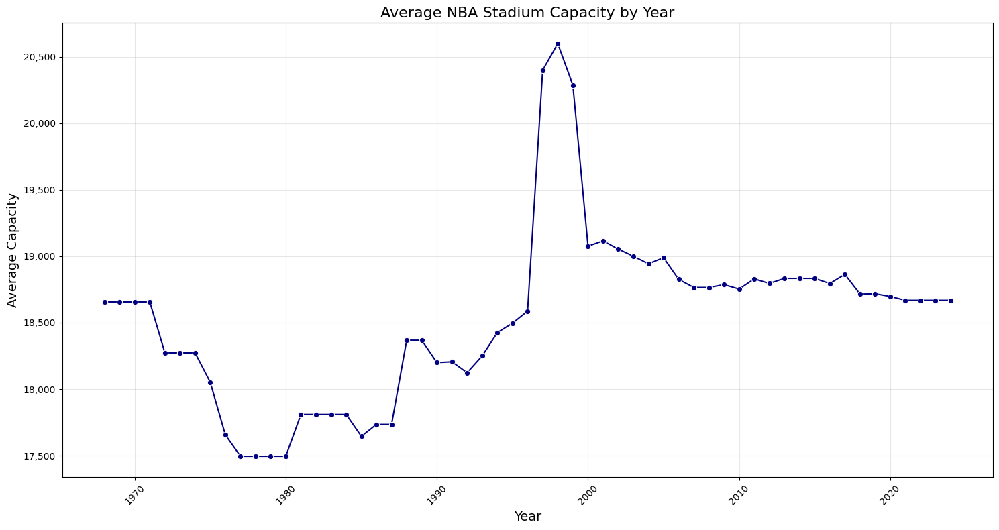

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load stadium capacity data
df = pd.read_csv('stadion_capacity.csv')

# Expand each row for every year the stadium was in use
rows = []
for _, row in df.iterrows():
    for year in range(row['start_year'], row['end_year'] + 1):
        rows.append({
            'team_id': row['team_id'],
            'abbreviation': row['abbreviation'],
            'stadion_name': row['stadion_name'],
            'capacity': row['capacity'],
            'year': year
        })

expanded_df = pd.DataFrame(rows)

# Calculate average stadium capacity per year
avg_capacity_per_year = expanded_df.groupby('year')['capacity'].mean().reset_index()

# Plot
plt.figure(figsize=(15, 8))
sns.lineplot(data=avg_capacity_per_year, x='year', y='capacity', marker='o', color='navy')

# Customize plot
plt.title('Average NBA Stadium Capacity by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Capacity', fontsize=14)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))
plt.tight_layout()
plt.show()


### Covid Analysis

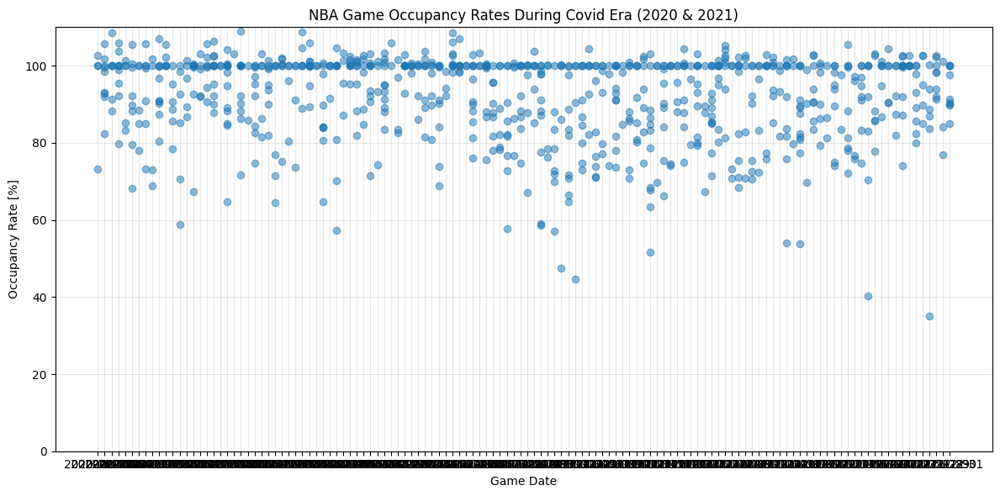

In [ ]:
import matplotlib.pyplot as plt

df = pd.read_csv('Master_Short_Data.csv')

# Filter for 2020 and 2021
covid_era = df[df['game_year'].isin([2020, 2021])]

# drop all rows between 2020 march and 2021 september
covid_era = covid_era[(covid_era['game_date'] < '2020-03-01') | (covid_era['game_date'] > '2021-10-15')]

plt.figure(figsize=(12, 6))
plt.plot(covid_era['game_date'], covid_era['occupancy_rate'], marker='o', linestyle='', alpha=0.5)
plt.title('NBA Game Occupancy Rates During Covid Era (2020 & 2021)')
plt.xlabel('Game Date')
plt.ylabel('Occupancy Rate [%]')
plt.ylim(0, 110)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

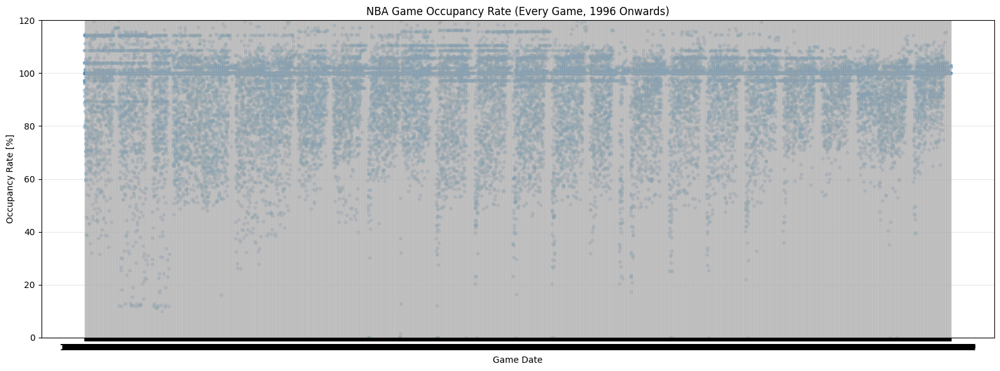

In [ ]:
import matplotlib.pyplot as plt

df = pd.read_csv('Master_Short_Data.csv')

# Filter for games from 1996 onwards
games_1996_onwards = df[df['game_year'] >= 1996]

plt.figure(figsize=(16, 6))
plt.scatter(games_1996_onwards['game_date'], games_1996_onwards['occupancy_rate'], alpha=0.3, s=10)
plt.title('NBA Game Occupancy Rate (Every Game, 1996 Onwards)')
plt.xlabel('Game Date')
plt.ylabel('Occupancy Rate [%]')
plt.ylim(0, 120)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

df['game_date'] = pd.to_datetime(df['game_date'])
df['year'] = df['game_date'].dt.year
df.groupby('year')['attendance'].mean().plot(marker='o')
plt.title("Durchschnittliche Attendance pro Jahr")
plt.ylabel("Durchschnittliche Zuschauerzahl")
plt.xlabel("Jahr")
plt.ylim(bottom=14000)  # Y-Achse beginnt bei 0
plt.grid(True)
plt.show()


KeyError: 'game_date'

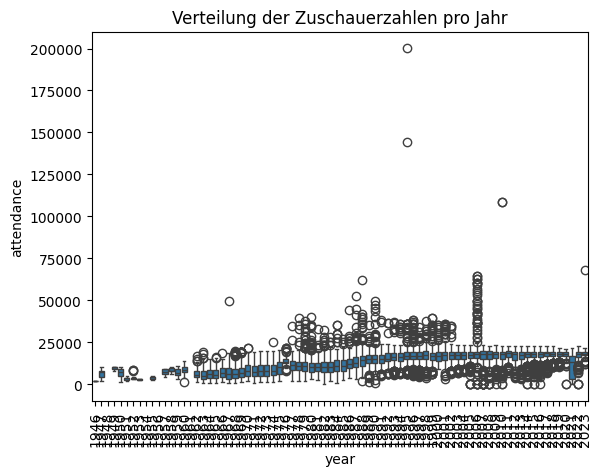

In [ ]:
import seaborn as sns

sns.boxplot(x='year', y='attendance', data=df)
plt.xticks(rotation=90)
plt.title("Verteilung der Zuschauerzahlen pro Jahr")
plt.show()


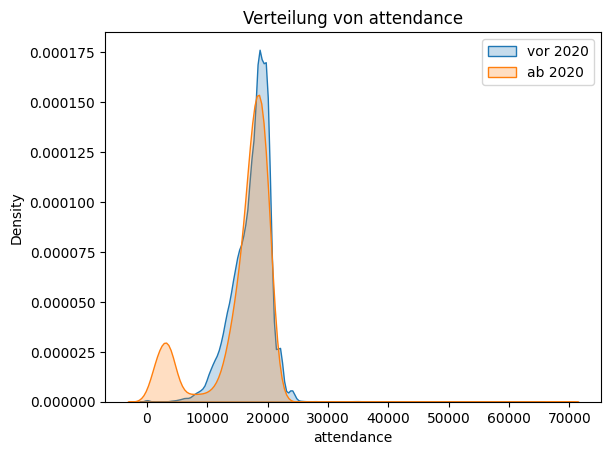

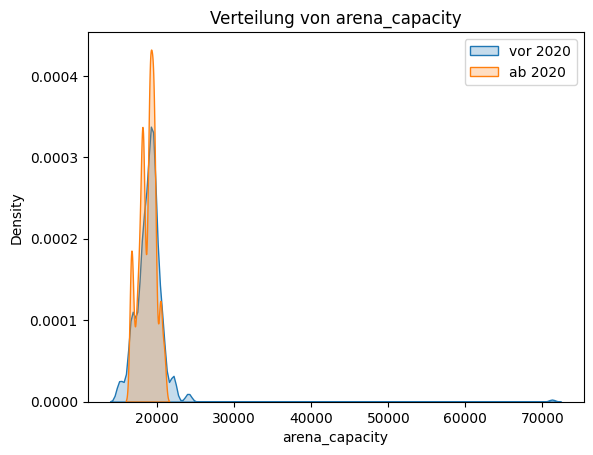

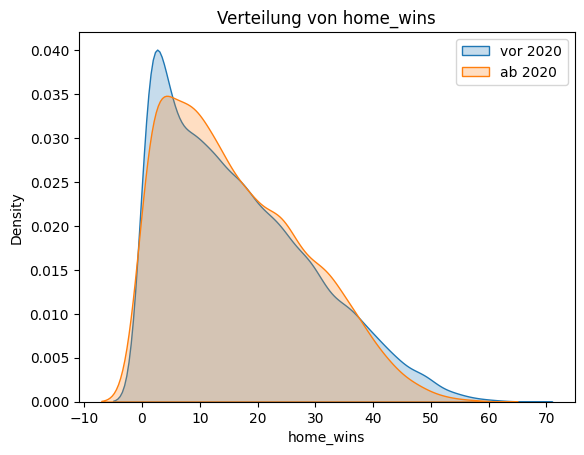

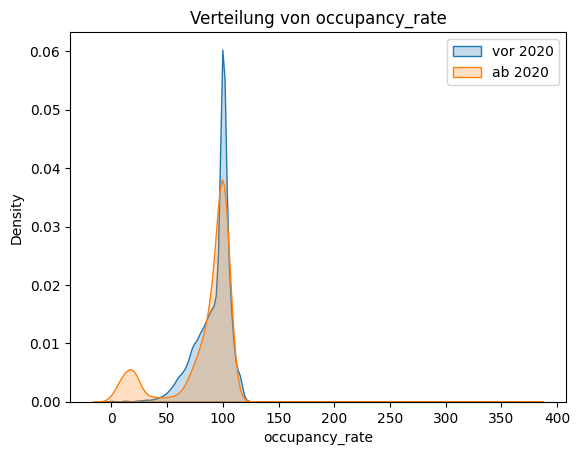

In [ ]:
df = pd.read_csv('Master_Short_Data.csv')

pre_2020 = df[df['game_date'] < "2020-01-01"]
post_2020 = df[df['game_date'] >= "2020-01-01"]

for feature in ['attendance', 'arena_capacity', 'home_wins', 'occupancy_rate']:
    sns.kdeplot(pre_2020[feature], label='vor 2020', fill=True)
    sns.kdeplot(post_2020[feature], label='ab 2020', fill=True)
    plt.title(f"Verteilung von {feature}")
    plt.legend()
    plt.show()

### Attendance, Capacity & Occupancy for each team over the years

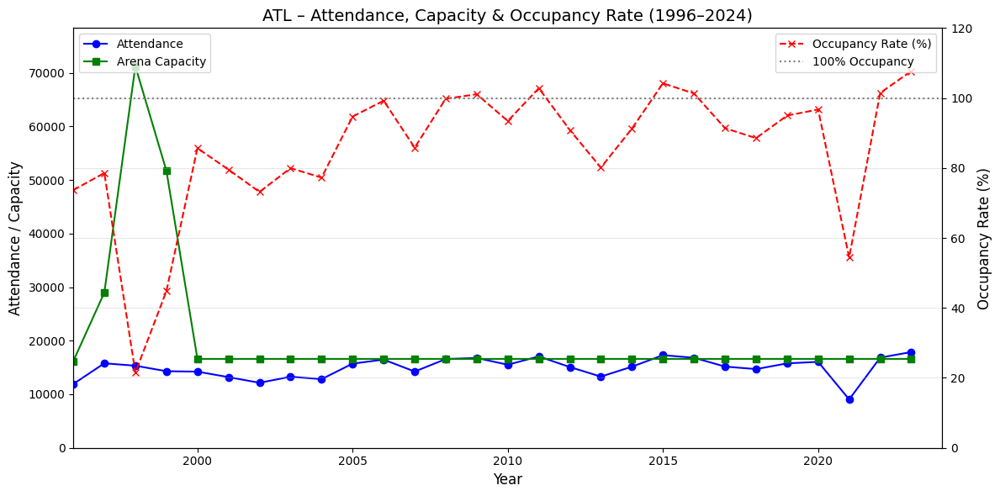

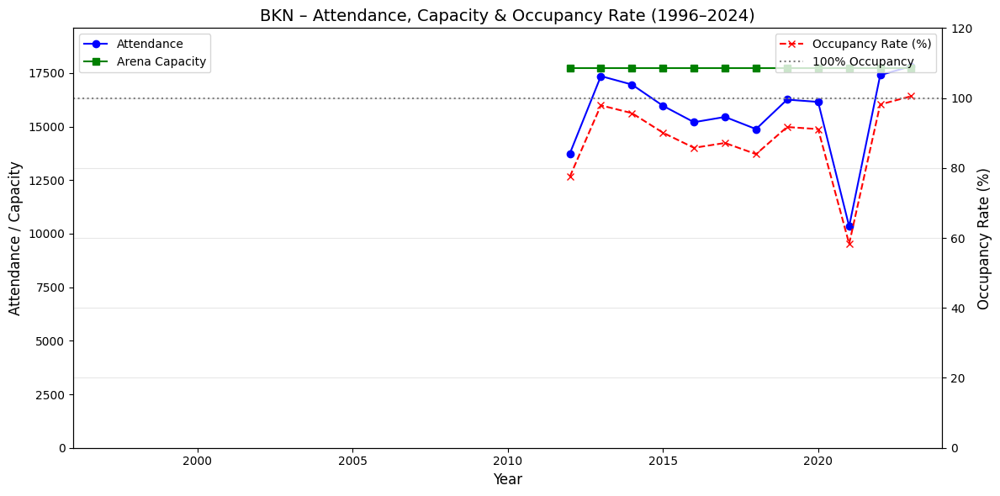

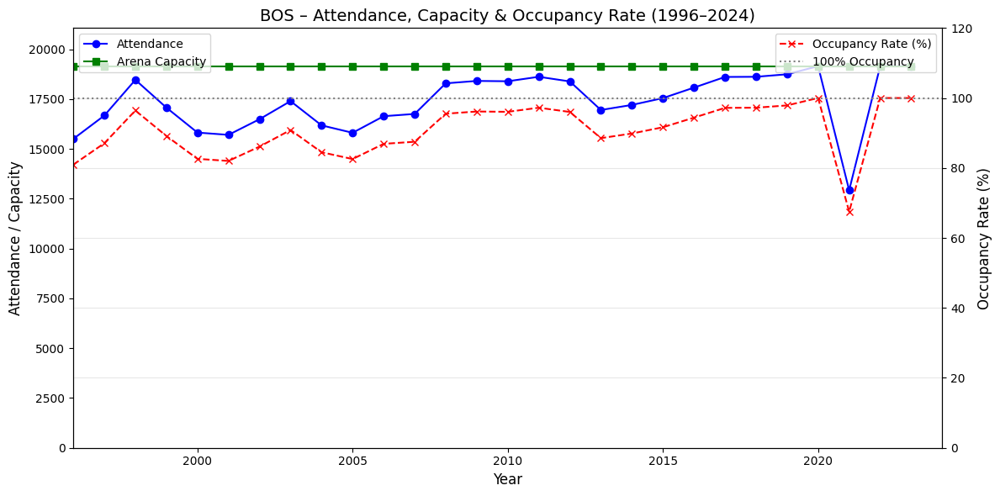

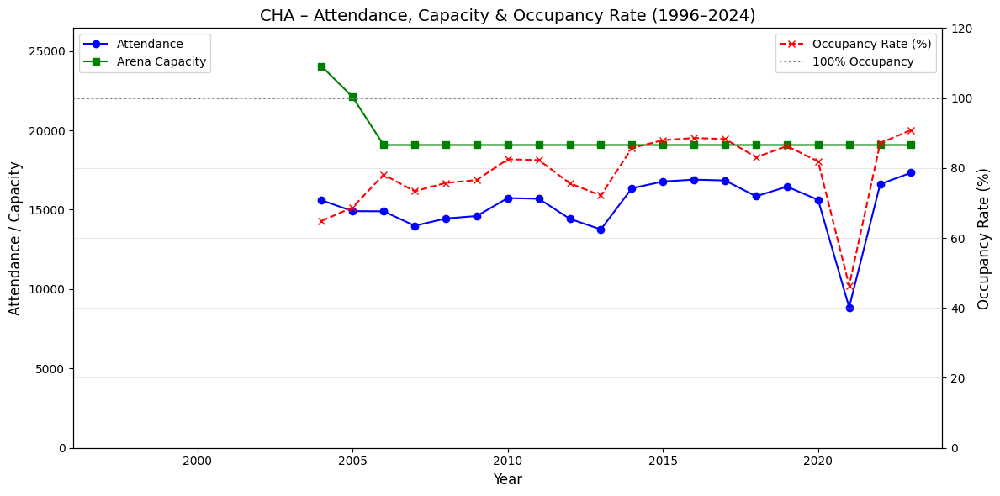

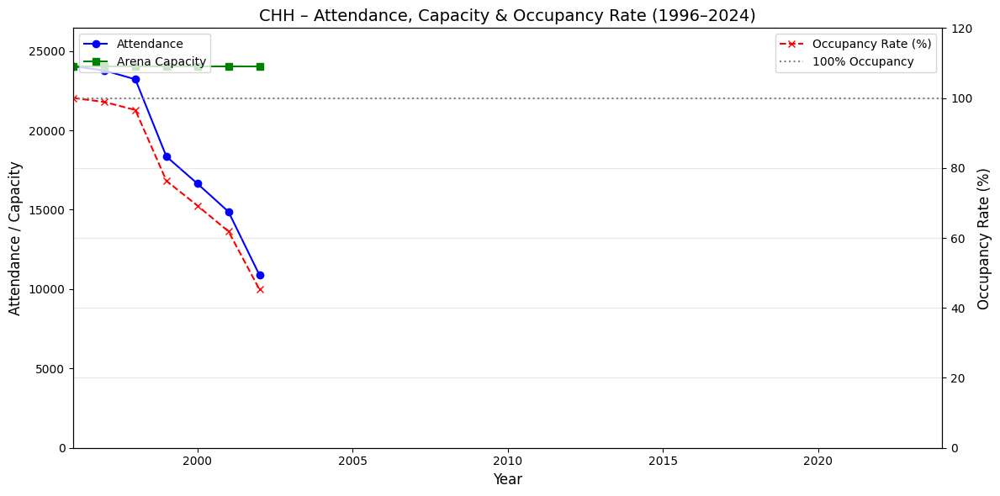

...

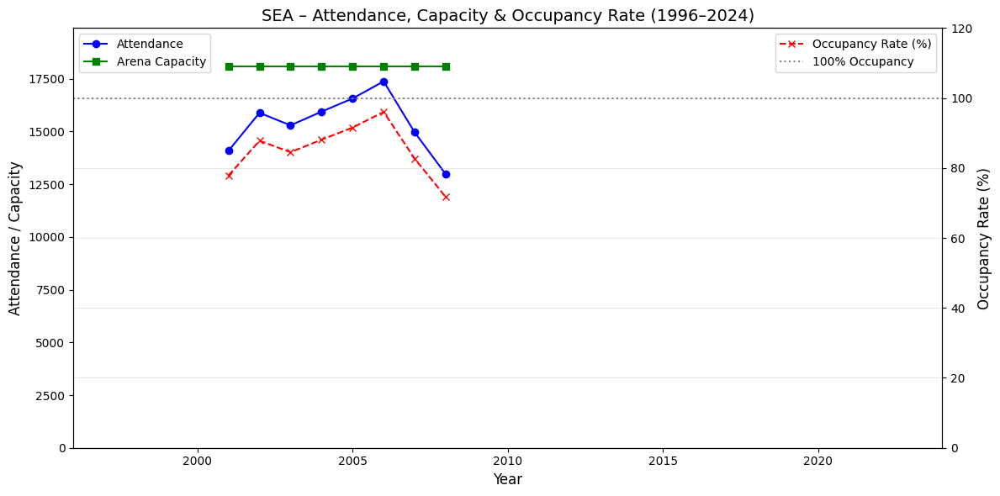

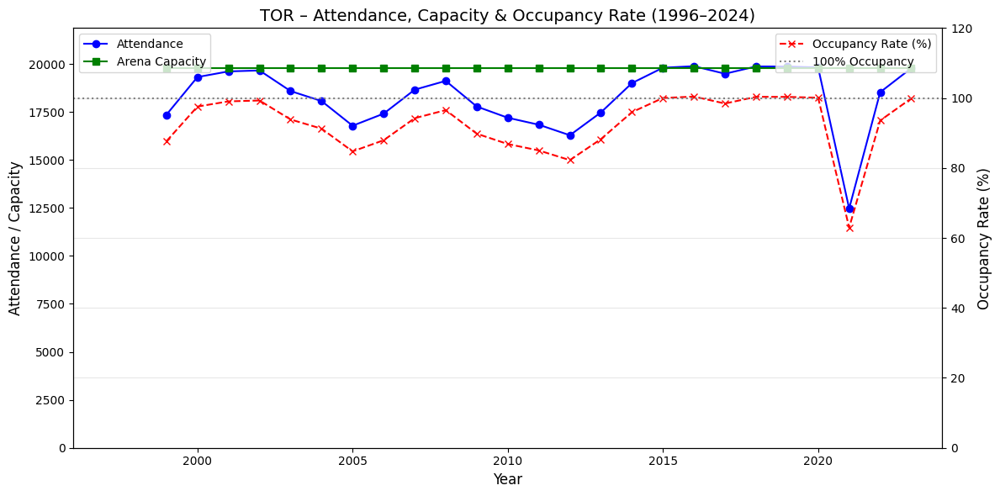

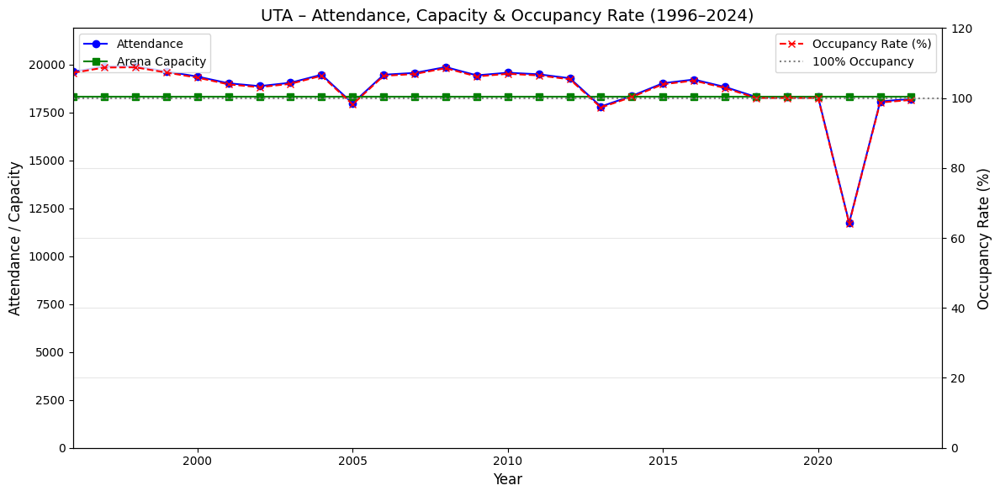

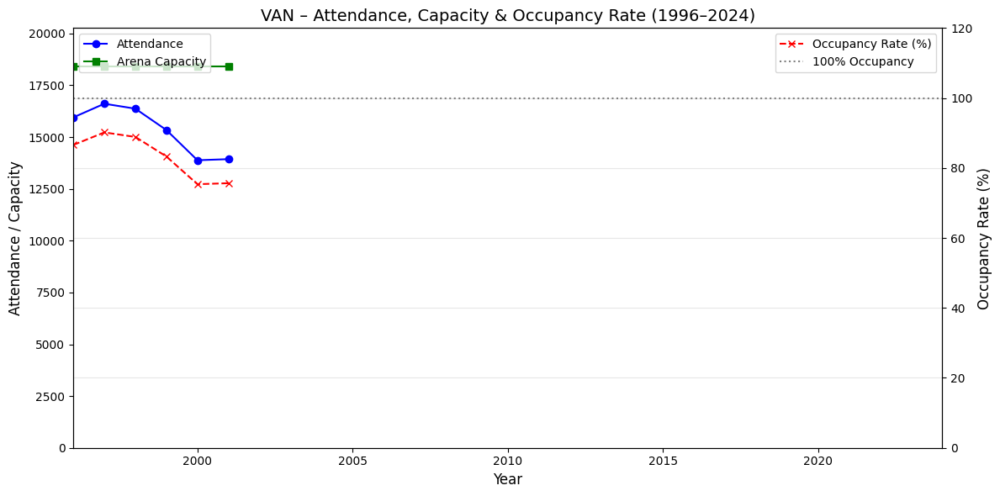

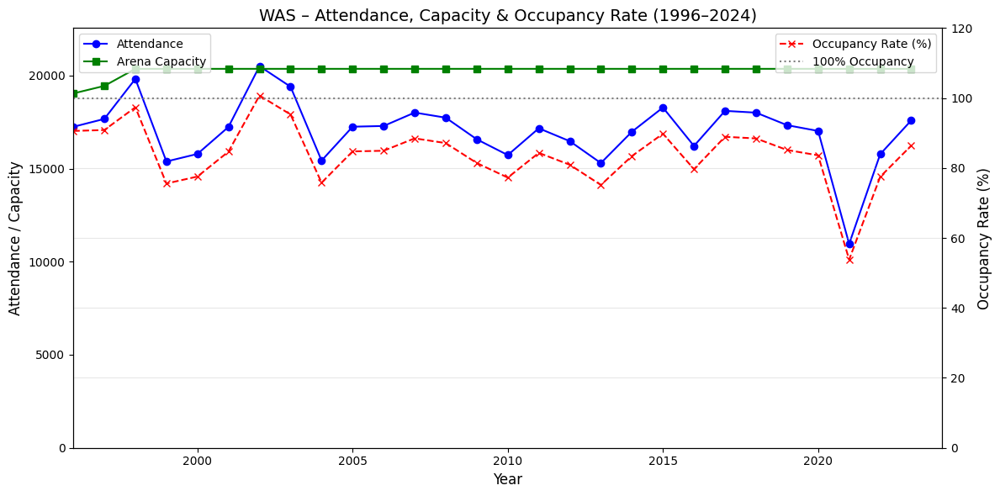

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Daten laden
df = pd.read_csv("Master_Short_Data.csv")

# Datum konvertieren
df['game_date'] = pd.to_datetime(df['game_date'])
df = df[df['game_date'].dt.year >= 1996]

# Jahr extrahieren
df['year'] = df['game_date'].dt.year

# Occupancy Rate berechnen
df['occupancy_rate'] = df['attendance'] / df['arena_capacity']

# Gruppierung Team & Jahr
team_year_data = df.groupby(['team_abbreviation_home', 'year']).agg({
    'attendance': 'mean',
    'arena_capacity': 'mean',
    'occupancy_rate': 'mean'
}).reset_index()

# Nur Teams mit gültigem arena_capacity
valid_teams = team_year_data.groupby('team_abbreviation_home')['arena_capacity'].apply(lambda x: x.notna().any())
valid_teams = valid_teams[valid_teams].index.tolist()

# Feste Jahresliste
all_years = pd.DataFrame({'year': list(range(1996, 2025))})

# Plot pro Team
for team in sorted(valid_teams):
    team_data = team_year_data[team_year_data['team_abbreviation_home'] == team]

    # Auffüllen fehlender Jahre
    team_data = pd.merge(all_years, team_data, on='year', how='left')

    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Attendance & Capacity (linke Achse)
    ax1.plot(team_data['year'], team_data['attendance'], label='Attendance', color='blue', marker='o')
    ax1.plot(team_data['year'], team_data['arena_capacity'], label='Arena Capacity', color='green', marker='s')
    ax1.set_ylabel('Attendance / Capacity', fontsize=12)
    ax1.set_xlabel('Year', fontsize=12)
    ax1.set_ylim(0, team_data[['attendance', 'arena_capacity']].max().max() * 1.1)
    ax1.set_xlim(1996, 2024)

    # Occupancy Rate (rechte Achse)
    ax2 = ax1.twinx()
    ax2.plot(team_data['year'], team_data['occupancy_rate'] * 100, label='Occupancy Rate (%)', color='red', linestyle='--', marker='x')
    ax2.axhline(y=100, color='gray', linestyle=':', linewidth=1.5, label='100% Occupancy')
    ax2.set_ylabel('Occupancy Rate (%)', fontsize=12)
    ax2.set_ylim(0, 120)

    # Titel & Legenden
    plt.title(f'{team} – Attendance, Capacity & Occupancy Rate (1996–2024)', fontsize=14)
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


### Anylzing Categorical Variables: Bar Charts

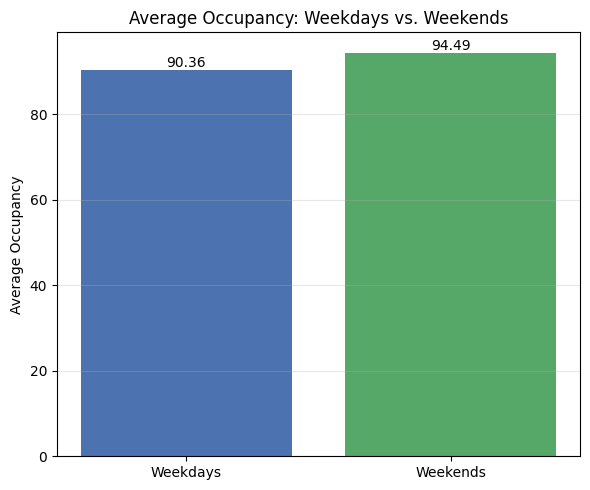

Difference in average Occupancy between weekdays and weekends: 4.1362430874001745


In [26]:
import matplotlib.pyplot as plt

# Ensure weekday_name exists
if 'weekday_name' not in df.columns:
    df['weekday_name'] = df['game_date'].dt.day_name()

# Define weekdays and weekends
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday']
weekends = ['Friday', 'Saturday', 'Sunday']

# Calculate average attendance
attendance_weekdays = df[df['weekday_name'].isin(weekdays)]['occupancy_rate'].mean()
attendance_weekends = df[df['weekday_name'].isin(weekends)]['occupancy_rate'].mean()

# Prepare data for bar chart
labels = ['Weekdays', 'Weekends']
values = [attendance_weekdays, attendance_weekends]

plt.figure(figsize=(6, 5))
bars = plt.bar(labels, values, color=['#4C72B0', '#55A868'])

# Add value labels above bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,   # X position
        height,                              # Y position
        f"{height:.2f}",                     # Text (2 decimal places)
        ha='center', va='bottom', fontsize=10
    )

plt.ylabel('Average Occupancy')
plt.title('Average Occupancy: Weekdays vs. Weekends')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Difference in average Occupancy between weekdays and weekends:",
      attendance_weekends - attendance_weekdays)


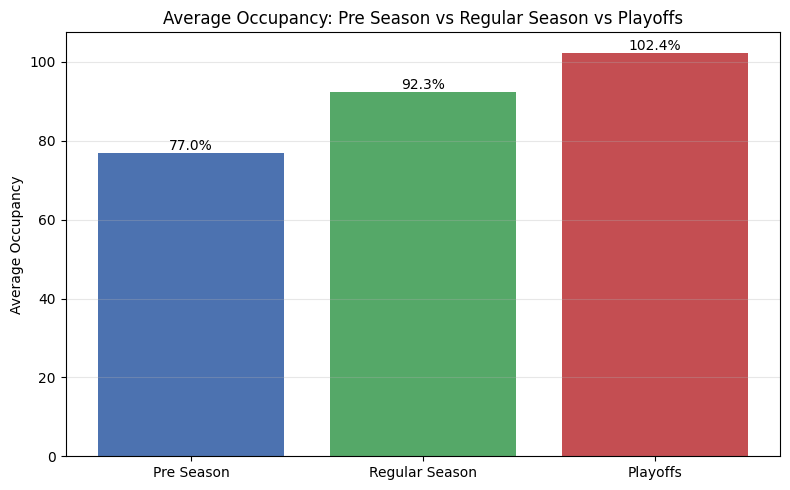

Difference in average Occupancy between playoffs and regular season: 10.074356306607115
Difference in average Occupancy between playoffs and Pre Season: 25.40985778827617
Difference in average Occupancy between Regular Season and Pre Season: 15.335501481669056


In [29]:
import matplotlib.pyplot as plt

# Ensure 'season_type' and 'attendance' columns exist
season_types = ['Pre Season', 'Regular Season', 'Playoffs']
attendance_by_type = (
    df[df['season_type'].isin(season_types)]
    .groupby('season_type')['occupancy_rate']
    .mean()
    .reindex(season_types)
)

plt.figure(figsize=(8, 5))
bars = plt.bar(
    attendance_by_type.index,
    attendance_by_type.values,
    color=['#4C72B0', '#55A868', '#C44E52']
)

# Add value labels above bars (as percentages)
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}%",  # convert to percentage with 1 decimal
        ha='center', va='bottom',
        fontsize=10
    )

plt.ylabel('Average Occupancy')
plt.title('Average Occupancy: Pre Season vs Regular Season vs Playoffs')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Difference in average Occupancy between playoffs and regular season:",
      attendance_by_type["Playoffs"] - attendance_by_type["Regular Season"])
print("Difference in average Occupancy between playoffs and Pre Season:",
      attendance_by_type["Playoffs"] - attendance_by_type["Pre Season"])
print("Difference in average Occupancy between Regular Season and Pre Season:",
      attendance_by_type["Regular Season"] - attendance_by_type["Pre Season"])


In [30]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
labels = ['No MVP', 'Home MVP', 'Away MVP']
means = [
    attendance_by_home_mvp[0],  # No Home MVP
    attendance_by_home_mvp[1],  # Home MVP
    attendance_by_away_mvp[1]   # Away MVP
]

# Calculate difference to 'No MVP'
diff_home = means[1] - means[0]
diff_away = means[2] - means[0]

plt.figure(figsize=(7, 5))
bars = plt.bar(labels, means, color=['#4C72B0', '#55A868', '#C44E52'])
plt.ylabel('Mean Occupancy Rate [%]')
plt.title('Mean Occupancy Rate: No MVP vs Home MVP vs Away MVP')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

# Annotate differences
plt.text(1, means[1]+1, f'+{diff_home:.2f}', ha='center', color='#55A868', fontsize=12)
plt.text(2, means[2]+1, f'+{diff_away:.2f}', ha='center', color='#C44E52', fontsize=12)

plt.show()
print(f"Difference Home MVP vs No MVP: {diff_home:.2f}")
print(f"Difference Away MVP vs No MVP: {diff_away:.2f}")

NameError: name 'attendance_by_home_mvp' is not defined

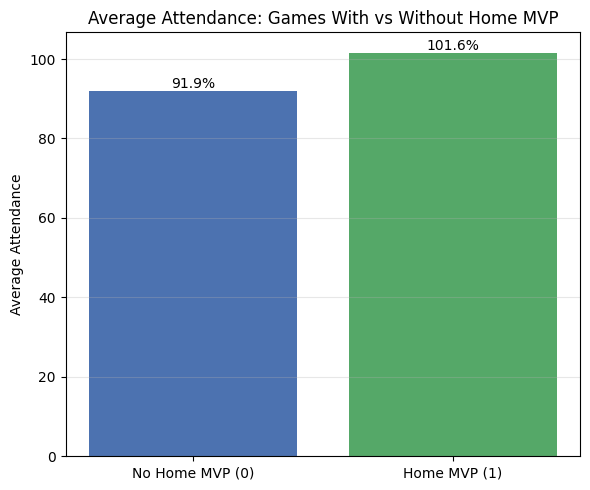

Difference in average Occupancy between having a MVP and not having one: 9.727330533751797


In [33]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.read_csv('Master_Short_Data.csv')

# Calculate average attendance for games with and without a home MVP
attendance_by_home_mvp = df.groupby('home_mvp')['occupancy_rate'].mean()

# Prepare labels
labels = ['No Home MVP (0)', 'Home MVP (1)']

plt.figure(figsize=(6, 5))
bars = plt.bar(labels, attendance_by_home_mvp.values, color=['#4C72B0', '#55A868'])

# Add value labels above bars (as percentages)
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}%",  # percentage with 1 decimal
        ha='center', va='bottom',
        fontsize=10
    )

plt.ylabel('Average Attendance')
plt.title('Average Attendance: Games With vs Without Home MVP')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Difference in average Occupancy between having a MVP and not having one:",
      attendance_by_home_mvp[1] - attendance_by_home_mvp[0])


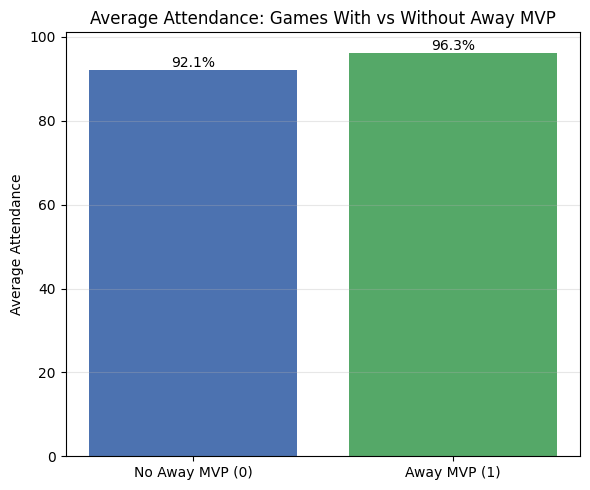

Difference in average Occupancy between having an away MVP and not having one: 4.165438764142493


In [35]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.read_csv('Master_Short_Data.csv')

# Calculate average attendance for games with and without an away MVP
attendance_by_away_mvp = df.groupby('away_mvp')['occupancy_rate'].mean()

# Prepare labels
labels = ['No Away MVP (0)', 'Away MVP (1)']

plt.figure(figsize=(6, 5))
bars = plt.bar(labels, attendance_by_away_mvp.values, color=['#4C72B0', '#55A868'])

# Add value labels above bars (as percentages)
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}%",  # percentage with 1 decimal place
        ha='center', va='bottom',
        fontsize=10
    )

plt.ylabel('Average Attendance')
plt.title('Average Attendance: Games With vs Without Away MVP')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Difference in average Occupancy between having an away MVP and not having one:",
      attendance_by_away_mvp[1] - attendance_by_away_mvp[0])


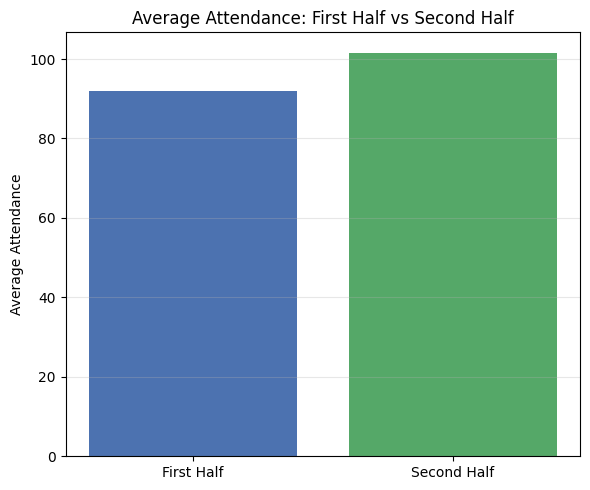

Difference in average attendance between first and second half (second half includes playoffs) 9.727330533751797


In [ ]:
import matplotlib.pyplot as plt

# Calculate average attendance for games with and without a home MVP
attendance_by_season_half = df.groupby('season_half')['attendance'].mean()

# Prepare labels
labels = ['First Half', 'Second Half']

plt.figure(figsize=(6, 5))
plt.bar(labels, attendance_by_home_mvp.values, color=['#4C72B0', '#55A868'])
plt.ylabel('Average Attendance')
plt.title('Average Attendance: First Half vs Second Half')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()
print("Difference in average attendance between first and second half (second half includes playoffs)", attendance_by_home_mvp[1] - attendance_by_home_mvp[0])

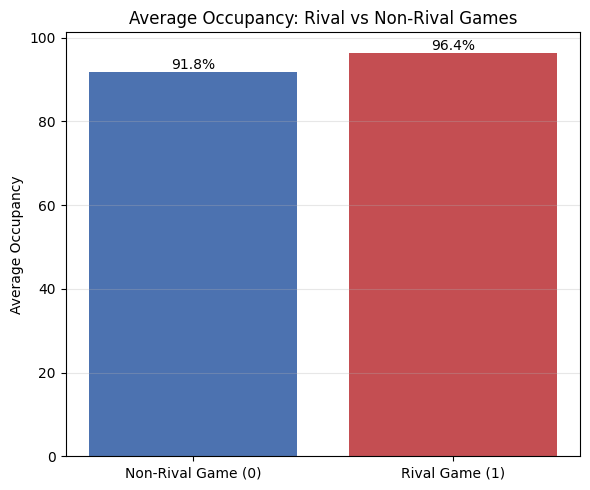

Difference in average Occupancy between a rival game and a regular game: 4.621902795092851


In [37]:
import matplotlib.pyplot as plt

# Calculate average attendance for rival and non-rival games
attendance_by_rival = df.groupby('rival_game')['occupancy_rate'].mean()

# Prepare labels
labels = ['Non-Rival Game (0)', 'Rival Game (1)']

plt.figure(figsize=(6, 5))
bars = plt.bar(labels, attendance_by_rival.values, color=['#4C72B0', '#C44E52'])

# Add value labels above bars (as percentages)
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}%",  # percentage with 1 decimal place
        ha='center', va='bottom',
        fontsize=10
    )

plt.ylabel('Average Occupancy')
plt.title('Average Occupancy: Rival vs Non-Rival Games')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Difference in average Occupancy between a rival game and a regular game:",
      attendance_by_rival[1] - attendance_by_rival[0])


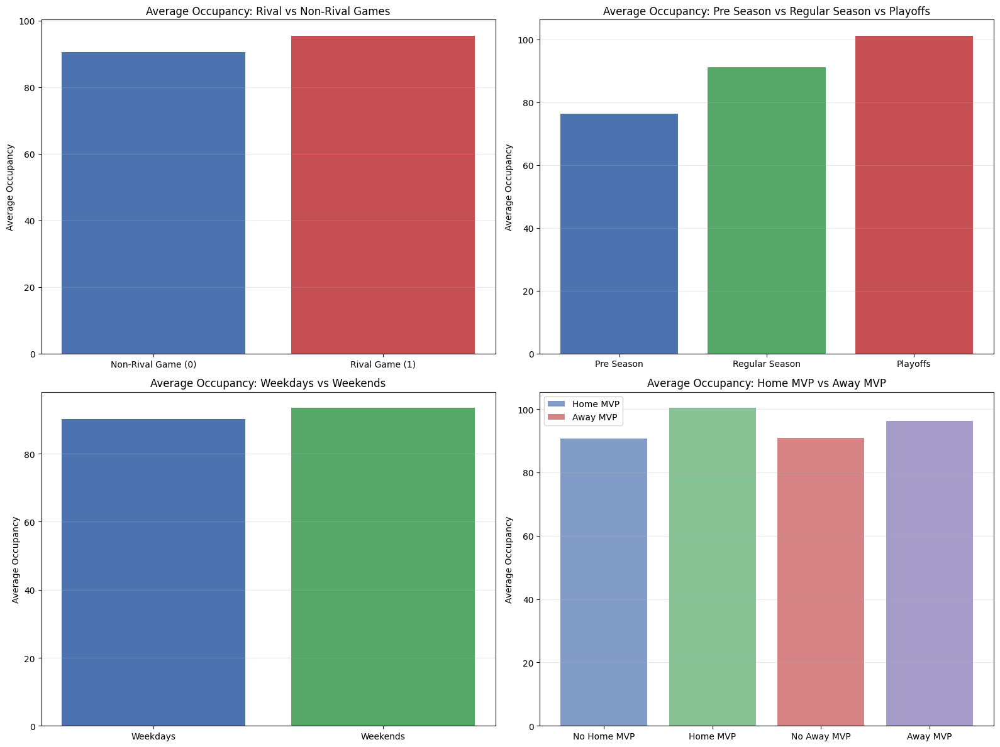

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.read_csv('Master_Short_Data.csv')
df['game_date'] = pd.to_datetime(df['game_date'])

fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# 1. Rival Games
attendance_by_rival = df.groupby('rival_game')['occupancy_rate'].mean()
axs[0, 0].bar(['Non-Rival Game (0)', 'Rival Game (1)'], attendance_by_rival.values, color=['#4C72B0', '#C44E52'])
axs[0, 0].set_title('Average Occupancy: Rival vs Non-Rival Games')
axs[0, 0].set_ylabel('Average Occupancy')
axs[0, 0].grid(axis='y', alpha=0.3)

# 2. Season Type
season_types = ['Pre Season', 'Regular Season', 'Playoffs']
attendance_by_type = df[df['season_type'].isin(season_types)].groupby('season_type')['occupancy_rate'].mean().reindex(season_types)
axs[0, 1].bar(attendance_by_type.index, attendance_by_type.values, color=['#4C72B0', '#55A868', '#C44E52'])
axs[0, 1].set_title('Average Occupancy: Pre Season vs Regular Season vs Playoffs')
axs[0, 1].set_ylabel('Average Occupancy')
axs[0, 1].grid(axis='y', alpha=0.3)

# 3. Weekend vs Weekday
if 'weekday_name' not in df.columns:
    df['weekday_name'] = df['game_date'].dt.day_name()
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
weekends = ['Saturday', 'Sunday']
attendance_weekdays = df[df['weekday_name'].isin(weekdays)]['occupancy_rate'].mean()
attendance_weekends = df[df['weekday_name'].isin(weekends)]['occupancy_rate'].mean()
axs[1, 0].bar(['Weekdays', 'Weekends'], [attendance_weekdays, attendance_weekends], color=['#4C72B0', '#55A868'])
axs[1, 0].set_title('Average Occupancy: Weekdays vs Weekends')
axs[1, 0].set_ylabel('Average Occupancy')
axs[1, 0].grid(axis='y', alpha=0.3)

# 4. Home MVP / Away MVP
attendance_by_home_mvp = df.groupby('home_mvp')['occupancy_rate'].mean()
attendance_by_away_mvp = df.groupby('away_mvp')['occupancy_rate'].mean()
axs[1, 1].bar(['No Home MVP', 'Home MVP'], attendance_by_home_mvp.values, color=['#4C72B0', '#55A868'], alpha=0.7, label='Home MVP')
axs[1, 1].bar(['No Away MVP', 'Away MVP'], attendance_by_away_mvp.values, color=['#C44E52', '#8172B2'], alpha=0.7, label='Away MVP')
axs[1, 1].set_title('Average Occupancy: Home MVP vs Away MVP')
axs[1, 1].set_ylabel('Average Occupancy')
axs[1, 1].legend()
axs[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

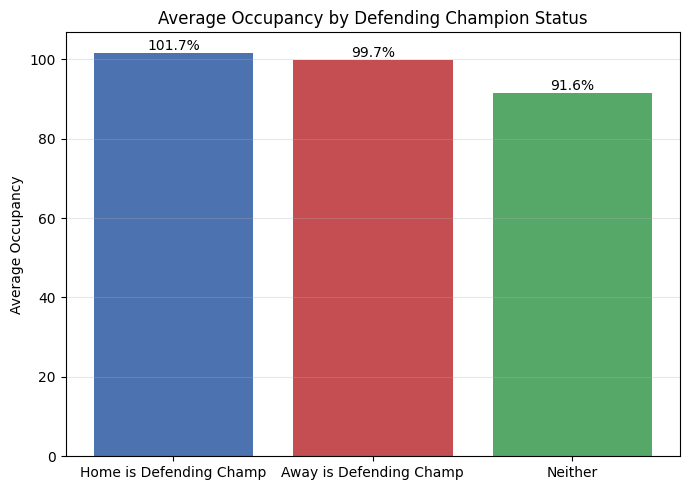

Difference (Home champ - Neither): 10.111951582259607
Difference (Away champ - Neither): 8.152877304958778


In [39]:
import matplotlib.pyplot as plt

# Calculate average attendance for each scenario
avg_home_champ = df[df['defending_champ_home'] == 1]['occupancy_rate'].mean()
avg_away_champ = df[df['defending_champ_away'] == 1]['occupancy_rate'].mean()
avg_neither = df[(df['defending_champ_home'] == 0) & (df['defending_champ_away'] == 0)]['occupancy_rate'].mean()

labels = ['Home is Defending Champ', 'Away is Defending Champ', 'Neither']
values = [avg_home_champ, avg_away_champ, avg_neither]

plt.figure(figsize=(7, 5))
bars = plt.bar(labels, values, color=['#4C72B0', '#C44E52', '#55A868'])

# Add value labels above bars (as percentages)
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        f"{height:.1f}%",  # percentage with 1 decimal place
        ha='center', va='bottom',
        fontsize=10
    )

plt.ylabel('Average Occupancy')
plt.title('Average Occupancy by Defending Champion Status')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Difference (Home champ - Neither):", avg_home_champ - avg_neither)
print("Difference (Away champ - Neither):", avg_away_champ - avg_neither)


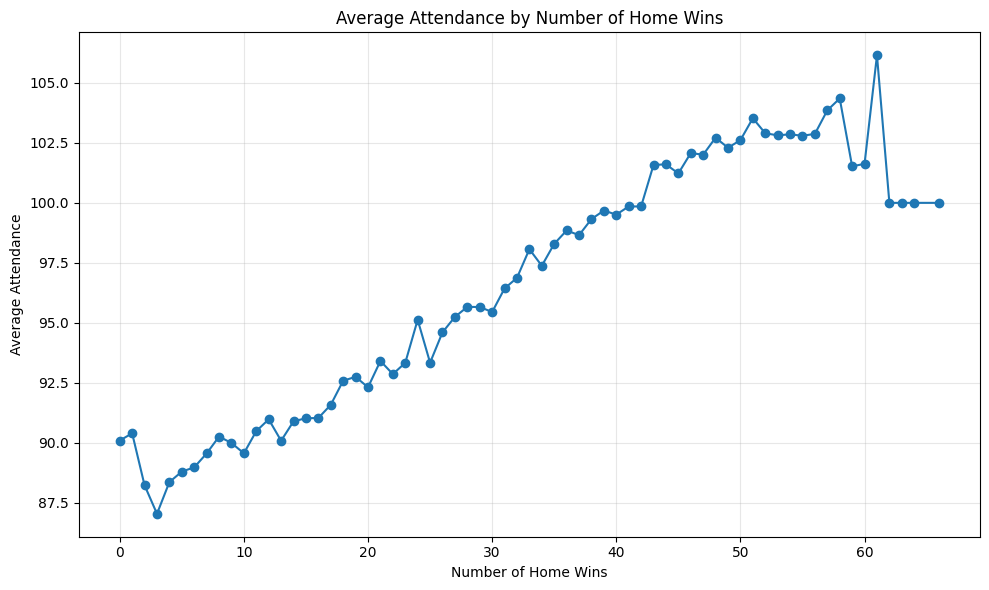

In [ ]:
import matplotlib.pyplot as plt

# Calculate average attendance for each number of home wins
attendance_by_home_wins = df.groupby('home_wins')['occupancy_rate'].mean()

plt.figure(figsize=(10, 6))
plt.plot(attendance_by_home_wins.index, attendance_by_home_wins.values, marker='o')
plt.xlabel('Number of Home Wins')
plt.ylabel('Average Attendance')
plt.title('Average Attendance by Number of Home Wins')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# import matplotlib.pyplot as plt

# df = pd.read_csv('Master_Short_Data.csv')

# # Use avg_occupancy_by_wins, which contains total_home_wins and occupancy_rate
# avg_occ = df.groupby('total_home_wins')['occupancy_rate'].mean().reset_index()

# plt.figure(figsize=(10, 6))
# plt.plot(avg_occ['total_home_wins'], avg_occ['occupancy_rate'], marker='o')
# plt.xlabel('Total Home Wins (Regular Season)')
# plt.ylabel('Average Occupancy Rate [%]')
# plt.title('Average Occupancy Rate vs. Total Home Wins (All Years)')
# plt.grid(alpha=0.3)
# plt.tight_layout()
# plt.show()


KeyError: 'total_home_wins'

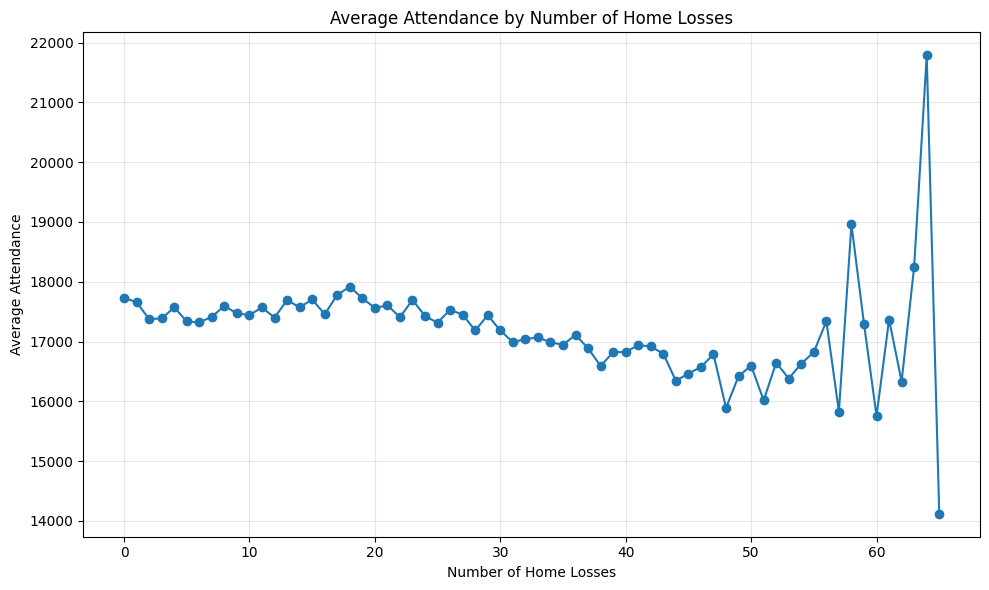

In [ ]:
import matplotlib.pyplot as plt

# Calculate average attendance for each number of home losses
attendance_by_home_losses = df.groupby('home_losses')['attendance'].mean()

plt.figure(figsize=(10, 6))
plt.plot(attendance_by_home_losses.index, attendance_by_home_losses.values, marker='o')
plt.xlabel('Number of Home Losses')
plt.ylabel('Average Attendance')
plt.title('Average Attendance by Number of Home Losses')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

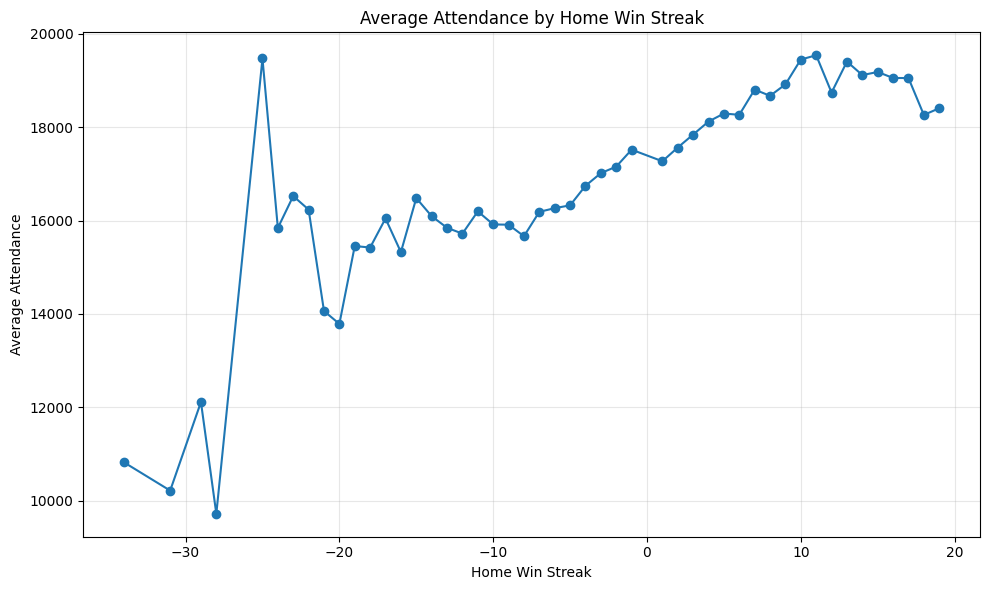

In [ ]:
import matplotlib.pyplot as plt

# Calculate average attendance for each home win streak
attendance_by_home_win_streak = df.groupby('home_win_streak')['attendance'].mean().sort_index()

plt.figure(figsize=(10, 6))
plt.plot(attendance_by_home_win_streak.index, attendance_by_home_win_streak.values, marker='o')
plt.xlabel('Home Win Streak')
plt.ylabel('Average Attendance')
plt.title('Average Attendance by Home Win Streak')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

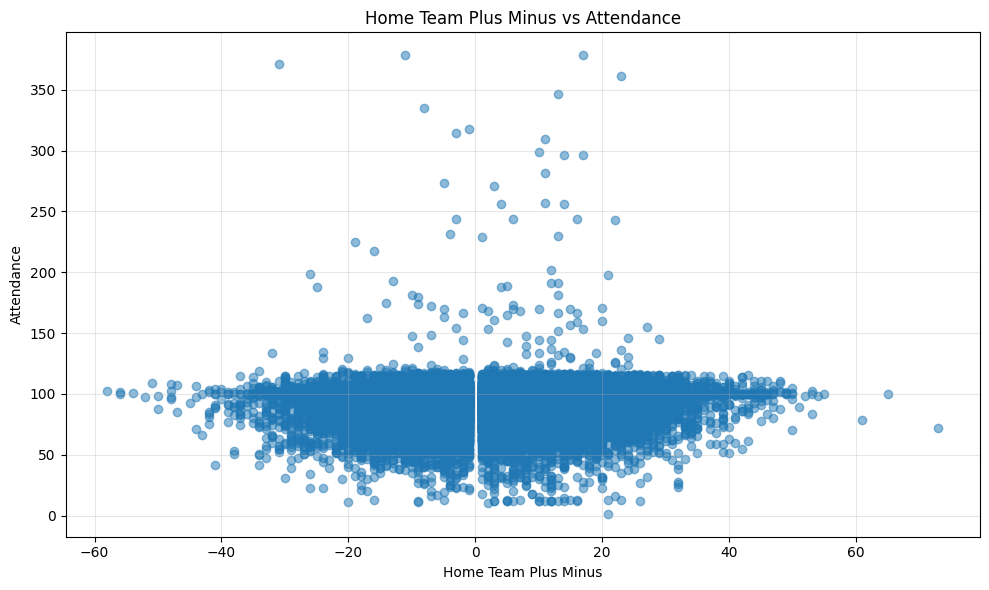

In [ ]:
import matplotlib.pyplot as plt

# Check if 'home_team_prev_season_avg_pts' exists
if 'plus_minus_home' in df.columns:
    plt.figure(figsize=(10, 6))
    plt.scatter(df['plus_minus_home'], df['occupancy_rate'], alpha=0.5)
    plt.xlabel('Home Team Plus Minus')
    plt.ylabel('Attendance')
    plt.title('Home Team Plus Minus vs Attendance')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("plus_minus_home column not found in df.")

In [ ]:
import matplotlib.pyplot as plt

# Check if 'home_team_prev_season_avg_pts' exists
if 'home_team_prev_season_avg_pts' in df.columns:
    plt.figure(figsize=(10, 6))
    plt.scatter(df['home_team_prev_season_avg_pts'], df['attendance'], alpha=0.5)
    plt.xlabel('Home Team Previous Season Avg Points')
    plt.ylabel('Attendance')
    plt.title('Home Team Previous Season Avg Points vs Attendance')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("'home_team_prev_season_avg_pts' column not found in df.")

'home_team_prev_season_avg_pts' column not found in df.


###  Analyzing Categorical Variables: Box plots

C:\Users\Martin\AppData\Local\Temp\ipykernel_18088\2064466700.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_outliers['week_part'] = df_no_outliers['weekday_name'].apply(lambda x: 'Weekend' if x in weekends else 'Weekday')
C:\Users\Martin\AppData\Local\Temp\ipykernel_18088\2064466700.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='week_part', y='attendance', data=df_no_outliers, palette=['#4C72B0', '#55A868'])


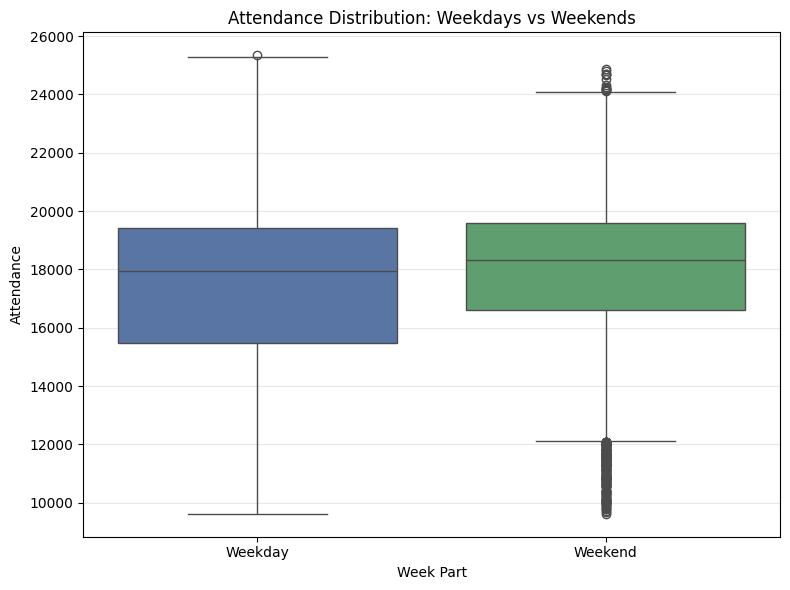

In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt

# Ensure 'weekday_name' exists
if 'weekday_name' not in df_no_outliers.columns:
    df_no_outliers['weekday_name'] = df_no_outliers['game_date'].dt.day_name()

# Create a new column for 'week_part'
df_no_outliers['week_part'] = df_no_outliers['weekday_name'].apply(lambda x: 'Weekend' if x in weekends else 'Weekday')

plt.figure(figsize=(8, 6))
sns.boxplot(x='week_part', y='attendance', data=df_no_outliers, palette=['#4C72B0', '#55A868'])
plt.title('Attendance Distribution: Weekdays vs Weekends')
plt.xlabel('Week Part')
plt.ylabel('Attendance')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

## More

#### Daily Distribtion of Attendance, Capacity & Occupancy

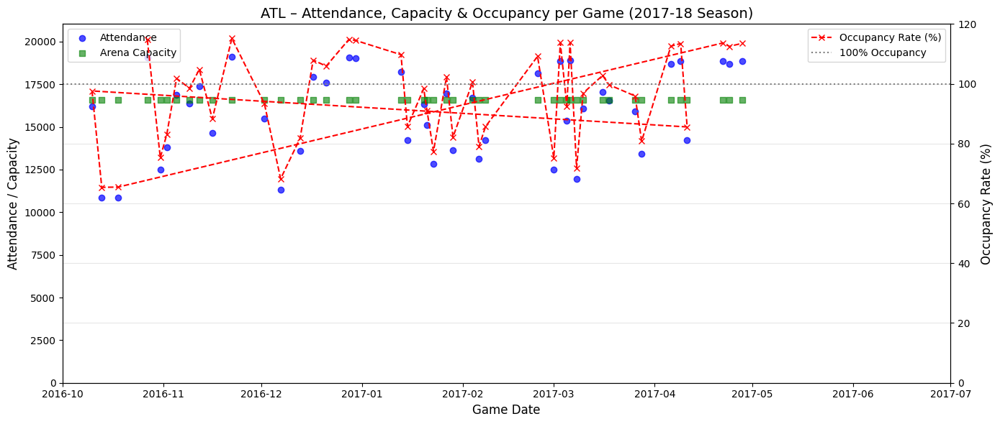

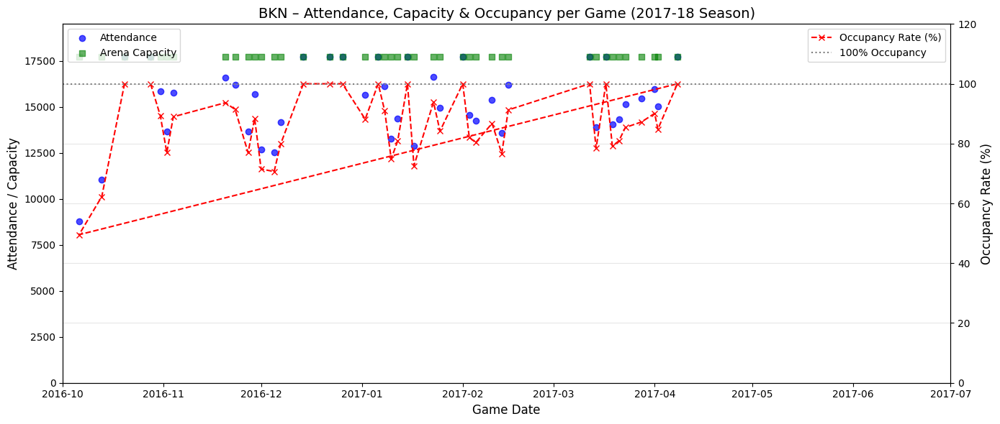

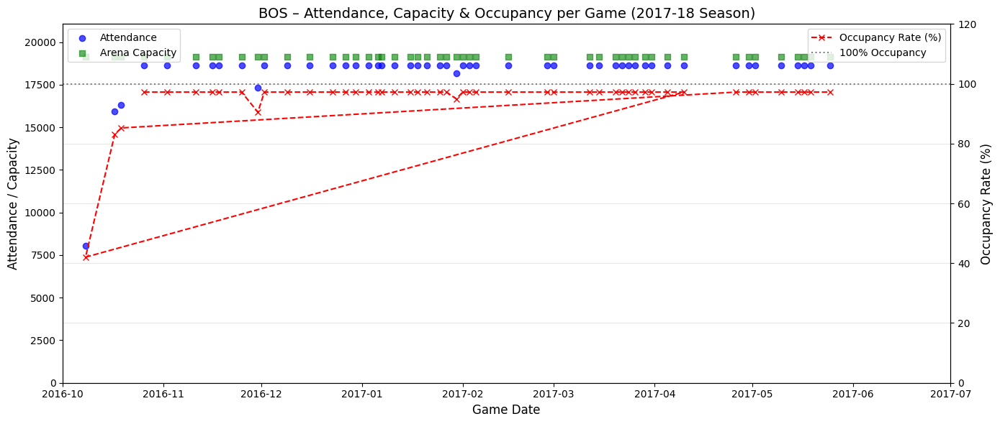

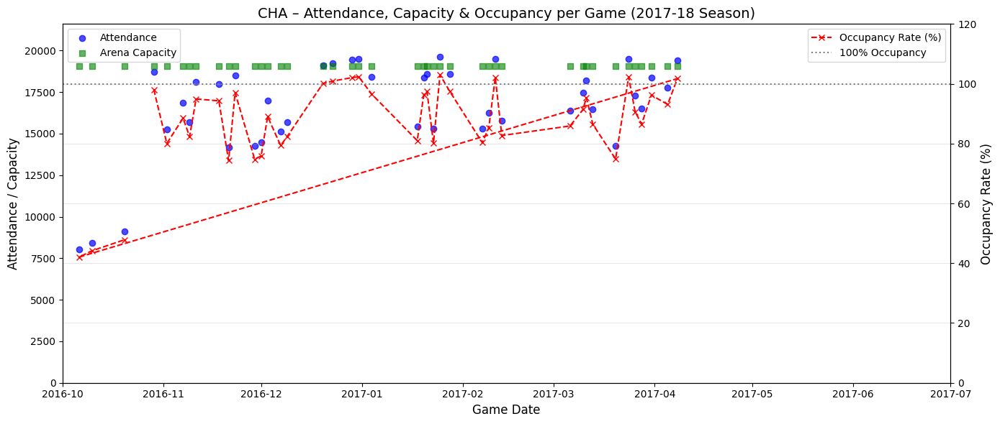

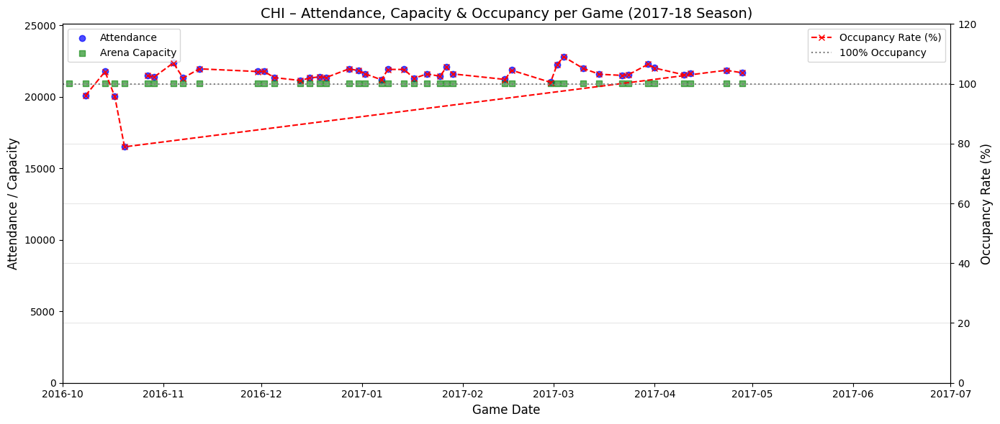

...

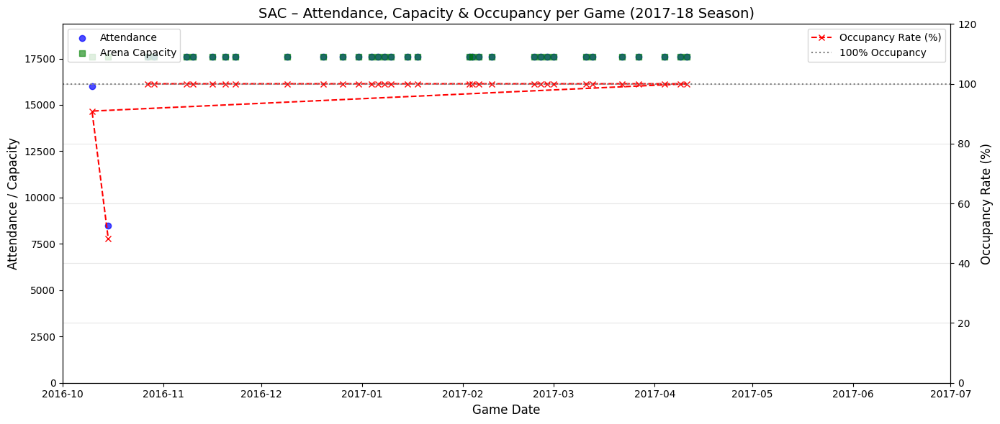

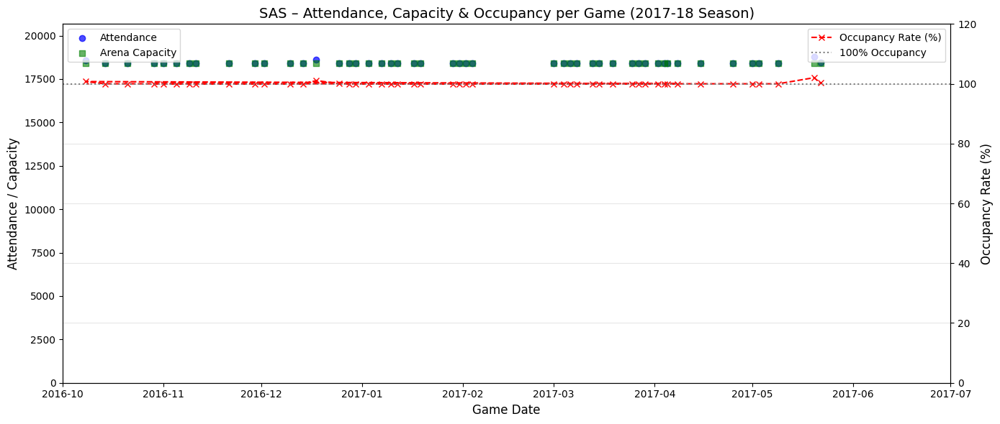

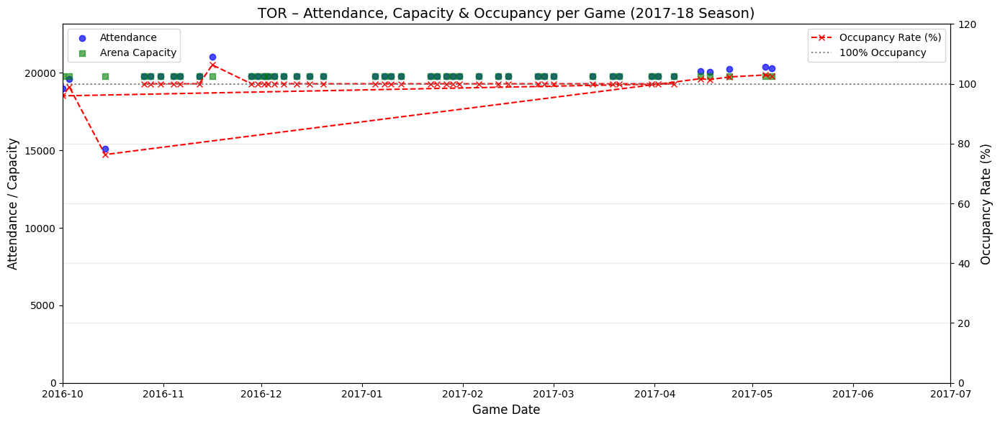

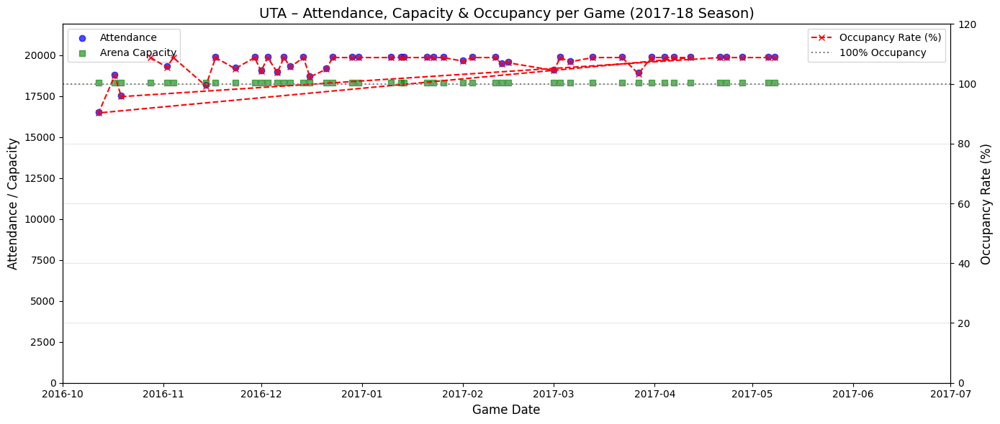

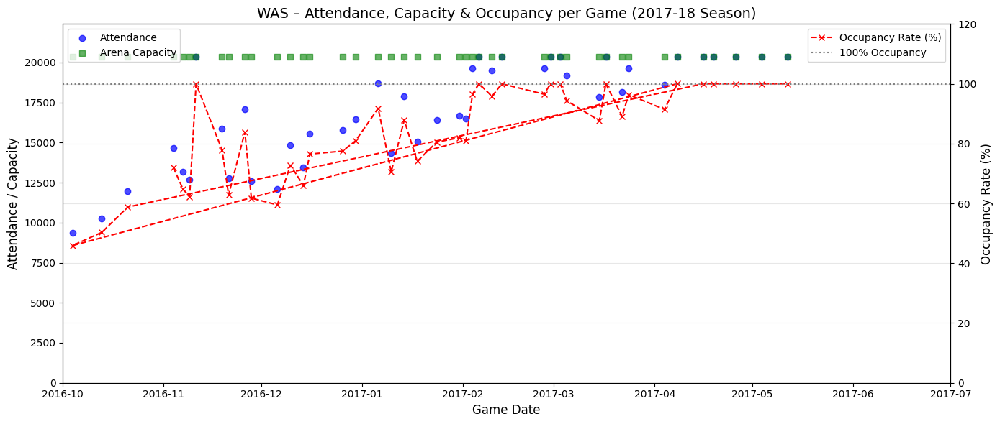

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Daten laden
df = pd.read_csv("Master_Short_Data.csv")

# Datum konvertieren
df['game_date'] = pd.to_datetime(df['game_date'])

# Zeitraum 2017-18 Saison inklusive Playoffs
df = df[(df['game_date'] >= '2016-10-01') & (df['game_date'] <= '2017-07-01')]

# Occupancy Rate berechnen
df['occupancy_rate'] = df['attendance'] / df['arena_capacity']

# Nur Teams mit gültiger arena_capacity
valid_teams = df.groupby('team_abbreviation_home')['arena_capacity'].apply(lambda x: x.notna().any())
valid_teams = valid_teams[valid_teams].index.tolist()

# Plot für jedes Team
for team in sorted(valid_teams):
    team_data = df[df['team_abbreviation_home'] == team]

    fig, ax1 = plt.subplots(figsize=(14, 6))

    # Attendance & Capacity als Scatterplot
    ax1.scatter(team_data['game_date'], team_data['attendance'], label='Attendance', color='blue', marker='o', alpha=0.7)
    ax1.scatter(team_data['game_date'], team_data['arena_capacity'], label='Arena Capacity', color='green', marker='s', alpha=0.6)
    ax1.set_ylabel('Attendance / Capacity', fontsize=12)
    ax1.set_xlabel('Game Date', fontsize=12)
    ax1.set_ylim(0, team_data[['attendance', 'arena_capacity']].max().max() * 1.1)
    ax1.set_xlim(pd.to_datetime('2016-10-01'), pd.to_datetime('2017-07-01'))

    # Occupancy Rate (rechte Achse)
    ax2 = ax1.twinx()
    ax2.plot(team_data['game_date'], team_data['occupancy_rate'] * 100, label='Occupancy Rate (%)', color='red', linestyle='--', marker='x')
    ax2.axhline(y=100, color='gray', linestyle=':', linewidth=1.5, label='100% Occupancy')
    ax2.set_ylabel('Occupancy Rate (%)', fontsize=12)
    ax2.set_ylim(0, 120)

    # Titel & Legenden
    plt.title(f'{team} – Attendance, Capacity & Occupancy per Game (2017-18 Season)', fontsize=14)
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


#### Teams that have never reached full capacity:

In [24]:
import pandas as pd

# Daten laden
df = pd.read_csv("Master_Short_Data.csv")

# Datum konvertieren
df['game_date'] = pd.to_datetime(df['game_date'])
df['year'] = df['game_date'].dt.year

# Zeitraum 1996 - 2024 filtern
df = df[(df['year'] >= 1996) & (df['year'] <= 2024)]

# Nur gültige Capacity-Werte berücksichtigen
df = df[df['arena_capacity'].notna()]

# Prüfen, ob attendance jemals >= arena_capacity pro Team
teams = df['team_abbreviation_home'].unique()
teams_never_full = []

for team in sorted(teams):
    team_data = df[df['team_abbreviation_home'] == team]

    # Bedingung: attendance >= capacity
    if not (team_data['attendance'] >= team_data['arena_capacity']).any():
        teams_never_full.append(team)

# Ergebnis ausgeben
print("Teams, die nie ein Spiel mit voller Kapazität (attendance >= arena_capacity) hatten:")
print(teams_never_full)


Teams, die nie ein Spiel mit voller Kapazität (attendance >= arena_capacity) hatten:
[]


#### How often Teams have exceeded the full capacity

In [26]:
import pandas as pd

# Daten laden
df = pd.read_csv("Master_Short_Data.csv")

# Datum konvertieren
df['game_date'] = pd.to_datetime(df['game_date'])
df['year'] = df['game_date'].dt.year

# Zeitraum 1996 - 2024
df = df[(df['year'] >= 1996) & (df['year'] <= 2024)]

# Nur gültige Capacity-Werte
df = df[df['arena_capacity'].notna()]

# Filter: attendance > capacity
over_capacity = df[df['attendance'] > df['arena_capacity']]

# Gruppieren und zählen
team_counts = over_capacity['team_abbreviation_home'].value_counts().sort_index()

# Ausgabe
print("Anzahl Spiele über Kapazität pro Team:")
print(team_counts)


Anzahl Spiele über Kapazität pro Team:
team_abbreviation_home
ATL    376
BKN     39
CHA    110
CHI    732
CLE    484
DAL    836
DEN    130
DET     34
GSW     60
HOU    404
IND    276
LAC    173
LAL     80
MEM      7
MIA    336
MIL    228
MIN    170
NJN     22
NOH     86
NOK     57
NOP    143
NYK      1
OKC     39
ORL    443
PHI    252
PHX    716
POR    592
SAC     49
SAS    528
SEA      3
TOR     84
UTA    684
VAN     21
WAS     85
Name: count, dtype: int64


#### How often Teams have reached exactly the Capacity

In [27]:
import pandas as pd

# Daten laden
df = pd.read_csv("Master_Short_Data.csv")

# Datum konvertieren
df['game_date'] = pd.to_datetime(df['game_date'])
df['year'] = df['game_date'].dt.year

# Zeitraum 1996 bis 2024
df = df[(df['year'] >= 1996) & (df['year'] <= 2024)]

# Nur gültige arena_capacity Werte berücksichtigen
df = df[df['arena_capacity'].notna()]

# Filter: attendance == arena_capacity
exact_capacity = df[df['attendance'] == df['arena_capacity']]

# Gruppieren und zählen
team_exact_counts = exact_capacity['team_abbreviation_home'].value_counts().sort_index()

# Ausgabe
print("Anzahl Spiele mit exakt voller Kapazität pro Team:")
print(team_exact_counts)


Anzahl Spiele mit exakt voller Kapazität pro Team:
team_abbreviation_home
BKN    116
BOS    122
CHA      4
CHH     60
CLE     98
DAL      4
DEN     54
DET    338
GSW    452
HOU    139
IND     45
LAC     73
MEM    103
MIA    350
MIL     59
NJN     46
NOP      1
NYK    239
OKC    392
ORL     93
PHX      1
POR     61
SAC    441
SAS    110
TOR    432
UTA    132
WAS     54
Name: count, dtype: int64


#### Correlation Matrix

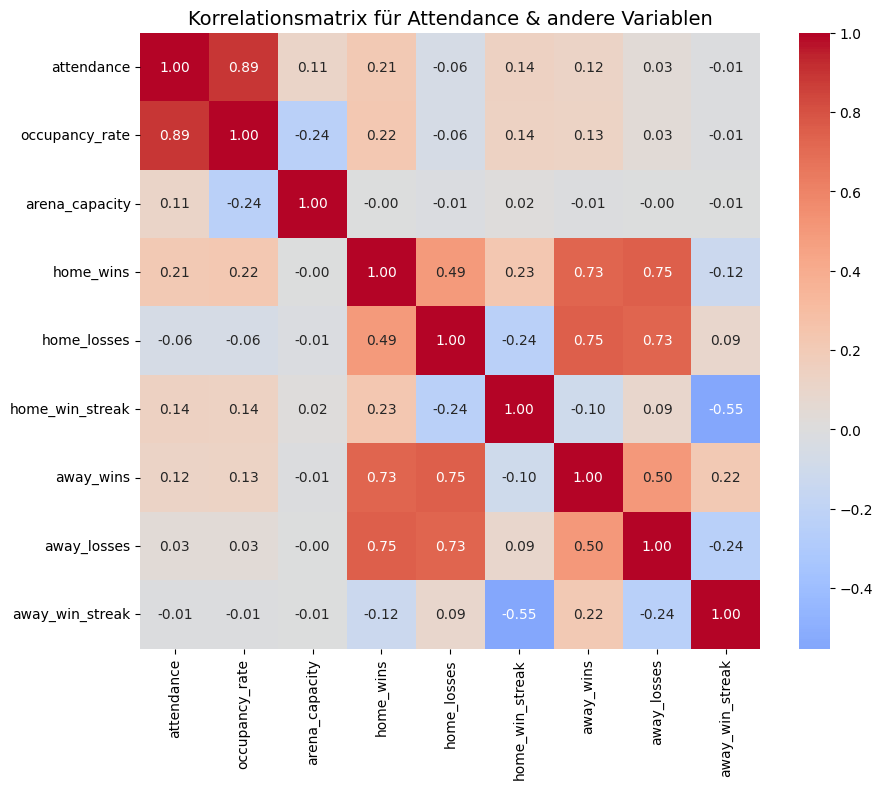

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Daten laden
df = pd.read_csv('Master_Short_Data.csv')

# Datum & Jahr anpassen, falls nötig
df['game_date'] = pd.to_datetime(df['game_date'])
df['game_year'] = df['game_date'].dt.year

# Relevante numerische Spalten extrahieren
num_cols = [
    'attendance', 'occupancy_rate', 'arena_capacity',
    'home_wins', 'home_losses', 'home_win_streak',
    'away_wins', 'away_losses', 'away_win_streak'
]

# Nur numerische Daten nehmen & NaNs entfernen
corr_data = df[num_cols].dropna()

# Korrelationsmatrix
corr_matrix = corr_data.corr()

# Heatmap plotten
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Korrelationsmatrix für Attendance & andere Variablen", fontsize=14)
plt.show()


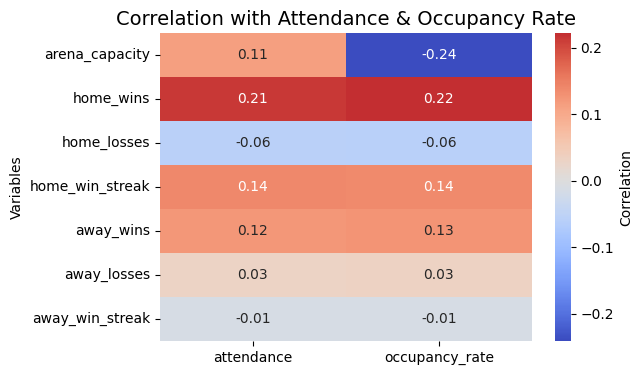

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('Master_Short_Data.csv')

# Ensure date column is datetime
df['game_date'] = pd.to_datetime(df['game_date'])
df['game_year'] = df['game_date'].dt.year

# Relevant numeric columns
num_cols = [
    'attendance', 'occupancy_rate', 'arena_capacity',
    'home_wins', 'home_losses', 'home_win_streak',
    'away_wins', 'away_losses', 'away_win_streak'
]

# Drop NaNs
corr_data = df[num_cols].dropna()

# Calculate correlations
corr_matrix = corr_data.corr()

# Filter: only keep correlations with attendance and occupancy_rate
target_corr = corr_matrix[['attendance', 'occupancy_rate']].drop(index=['attendance', 'occupancy_rate'])

# Plot
plt.figure(figsize=(6, 4))
sns.heatmap(target_corr, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={"label": "Correlation"})
plt.title("Correlation with Attendance & Occupancy Rate", fontsize=14)
plt.ylabel("Variables")
plt.show()


=> Home Wins und winning streak zeigen gute korrelation - Away wins/ losses machen natürlich keinen Sinn

#### Kategorische Daten

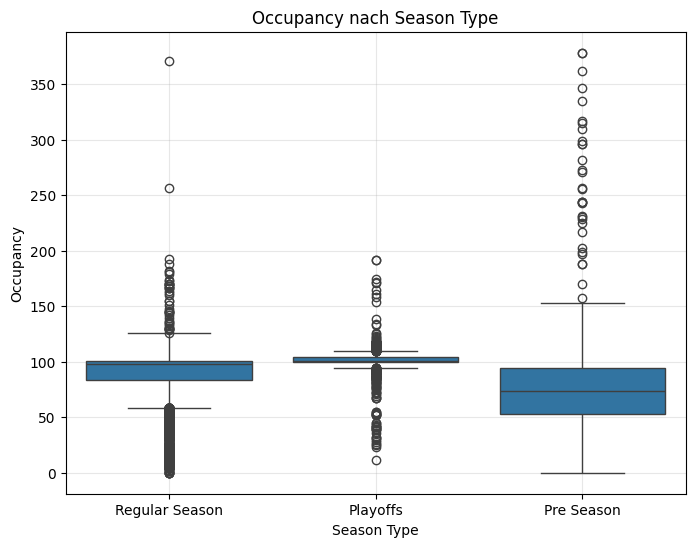

C:\Users\Martin\AppData\Local\Temp\ipykernel_27572\1510006717.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=occupancy_per_team.values, y=occupancy_per_team.index, palette="viridis")


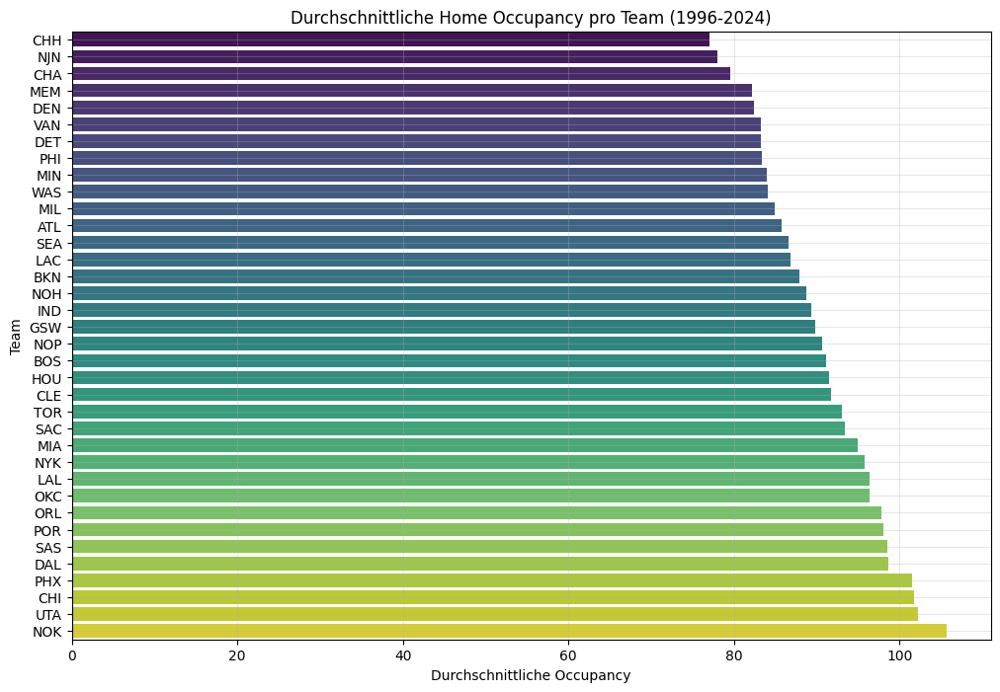

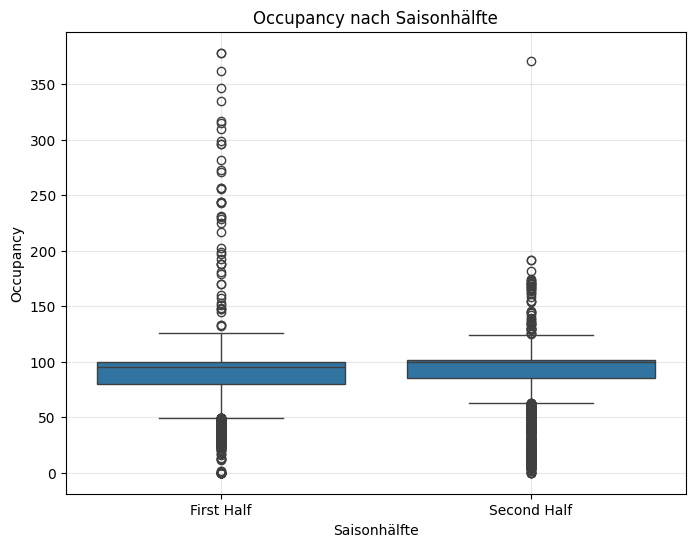

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Daten laden
df = pd.read_csv('Master_Short_Data.csv')

# Daten vorbereiten
df['game_date'] = pd.to_datetime(df['game_date'])
df['game_year'] = df['game_date'].dt.year

# Plot 1: Occupancy nach Season Type (Regular Season vs Playoffs)
plt.figure(figsize=(8,6))
sns.boxplot(data=df, x='season_type', y='occupancy_rate')
plt.title("Occupancy nach Season Type")
plt.ylabel("Occupancy")
plt.xlabel("Season Type")
plt.grid(alpha=0.3)
plt.show()

# Plot 2: Durchschnittliche Occupancy pro Team (nur Home Games)
occupancy_per_team = df.groupby('team_abbreviation_home')['occupancy_rate'].mean().sort_values()

plt.figure(figsize=(12,8))
sns.barplot(x=occupancy_per_team.values, y=occupancy_per_team.index, palette="viridis")
plt.title("Durchschnittliche Home Occupancy pro Team (1996-2024)")
plt.xlabel("Durchschnittliche Occupancy")
plt.ylabel("Team")
plt.grid(alpha=0.3)
plt.show()

# Plot 3: Occupancy nach Saisonhälfte
plt.figure(figsize=(8,6))
sns.boxplot(data=df, x='season_half', y='occupancy_rate')
plt.title("Occupancy nach Saisonhälfte")
plt.ylabel("Occupancy")
plt.xlabel("Saisonhälfte")
plt.grid(alpha=0.3)
plt.show()


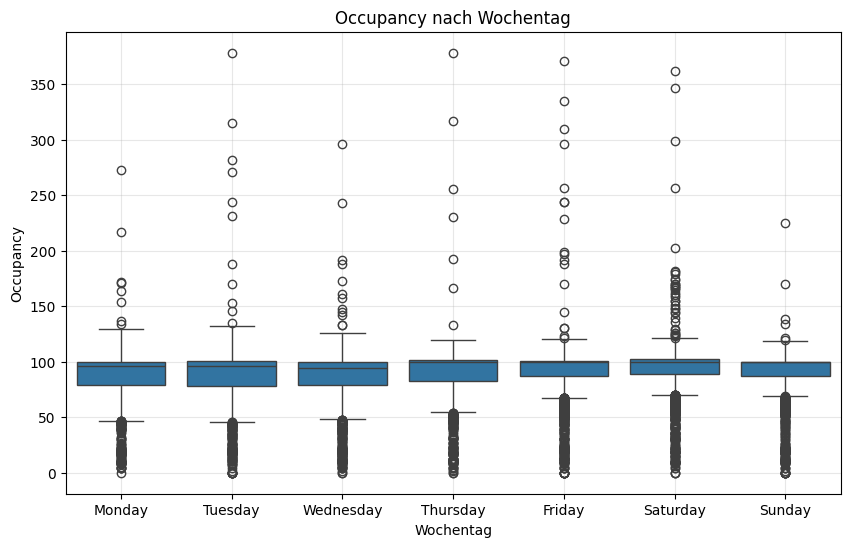

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='weekday_name', y='occupancy_rate', order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.title('Occupancy nach Wochentag')
plt.ylabel('Occupancy')
plt.xlabel('Wochentag')
plt.grid(alpha=0.3)
plt.show()


C:\Users\Martin\AppData\Local\Temp\ipykernel_27572\899566400.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=weekday_stats.index, y=weekday_stats['mean'], palette='Blues_r', yerr=weekday_stats['std'])


ValueError: 'yerr' (shape: (7,)) must be a scalar or a 1D or (2, n) array-like whose shape matches 'y' (shape: (1,))

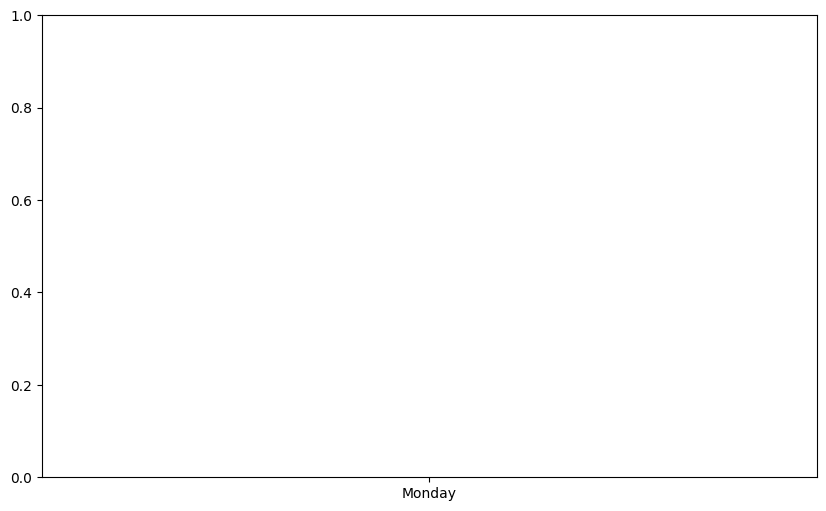

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Falls noch nicht berechnet:
df['game_date'] = pd.to_datetime(df['game_date'])
df['weekday_name'] = df['game_date'].dt.day_name()

weekday_stats = df.groupby('weekday_name')['occupancy_rate'].agg(['mean', 'std']).reindex([
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'
])

plt.figure(figsize=(10,6))
sns.barplot(x=weekday_stats.index, y=weekday_stats['mean'], palette='Blues_r', yerr=weekday_stats['std'])
plt.title('Durchschnittliche Occupancy mit Streuung pro Wochentag')
plt.xlabel('Wochentag')
plt.ylabel('Durchschnittliche Occupancy')
plt.grid(alpha=0.3)
plt.show()


C:\Users\Martin\AppData\Local\Temp\ipykernel_27572\3064983277.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='matchup_home', y='occupancy_rate_percent', order=order, palette='viridis')


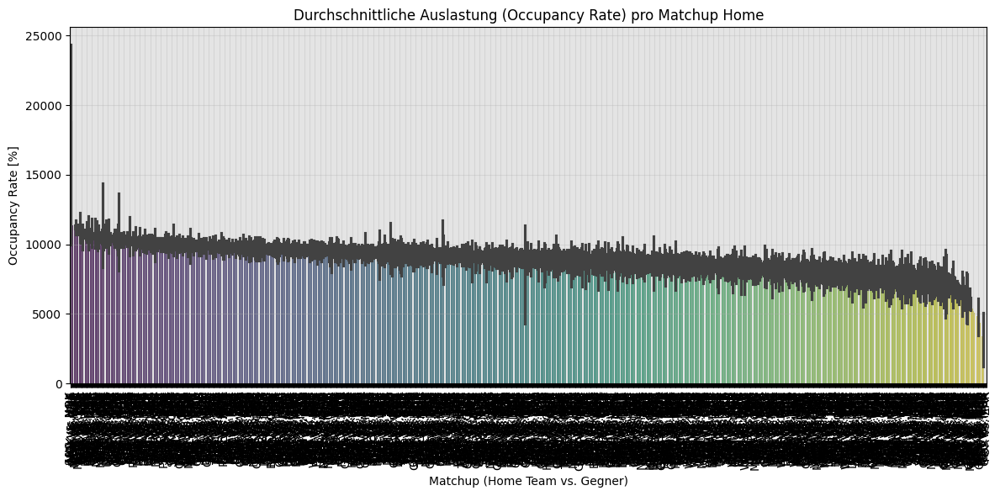

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass occupancy_rate korrekt als Prozentzahl vorliegt
df['occupancy_rate_percent'] = df['occupancy_rate'] * 100

plt.figure(figsize=(12,6))
# Sortiere nach mittlerer Auslastung, für schönere Achsenreihenfolge
order = df.groupby('matchup_home')['occupancy_rate_percent'].mean().sort_values(ascending=False).index

sns.barplot(data=df, x='matchup_home', y='occupancy_rate_percent', order=order, palette='viridis')
plt.xticks(rotation=90)
plt.title('Durchschnittliche Auslastung (Occupancy Rate) pro Matchup Home')
plt.ylabel('Occupancy Rate [%]')
plt.xlabel('Matchup (Home Team vs. Gegner)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


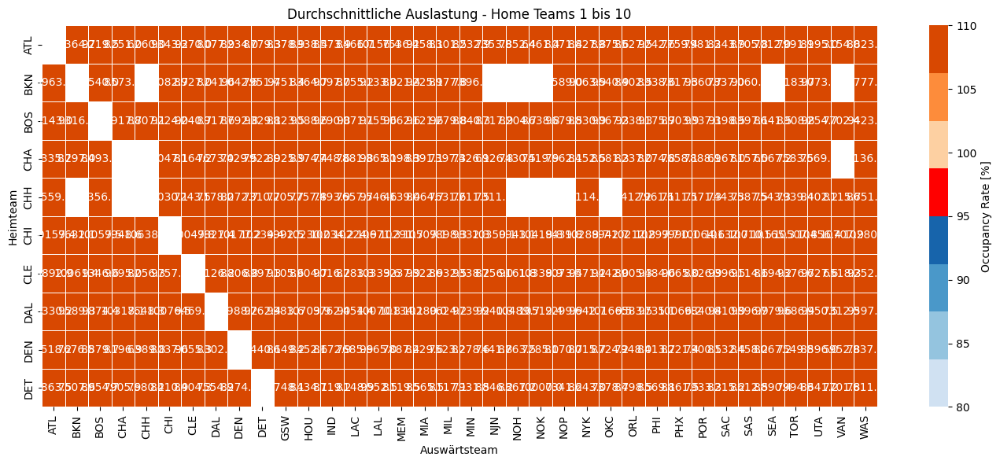

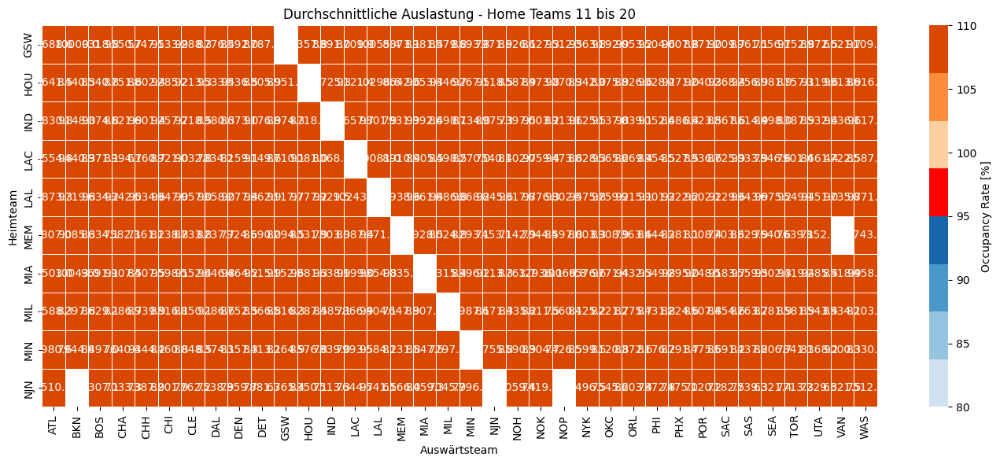

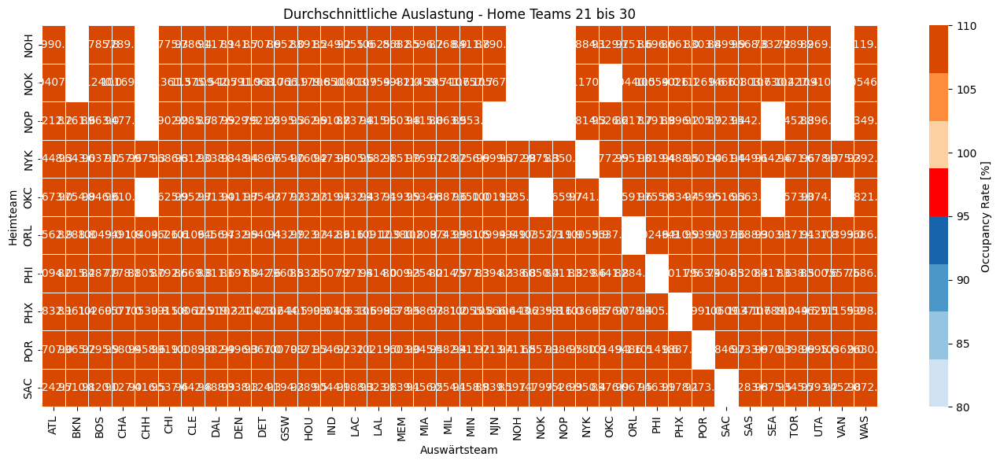

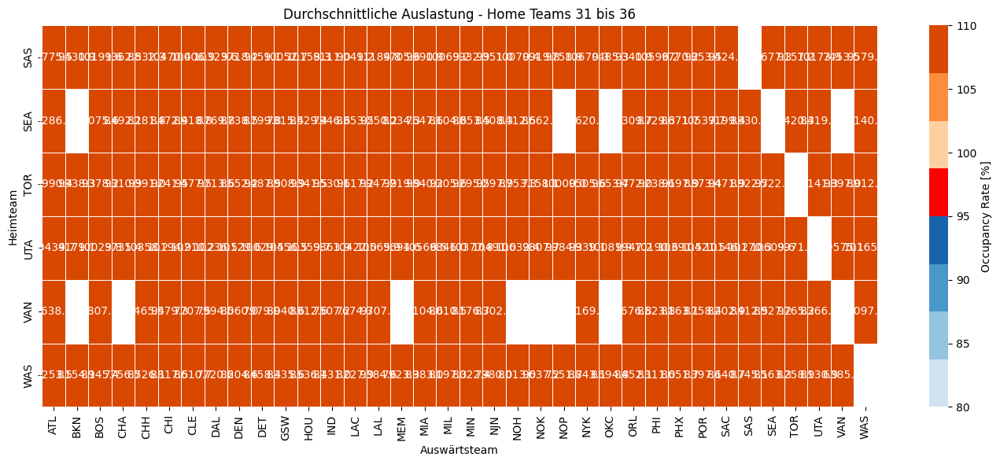

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Sicherstellen, dass occupancy_rate Prozent korrekt vorliegt
df['occupancy_rate_percent'] = df['occupancy_rate'] * 100

# Pivot-Tabelle: Heim vs. Auswärtsteam, mittlere Auslastung
pivot = df.pivot_table(
    index='team_abbreviation_home',
    columns='team_abbreviation_away',
    values='occupancy_rate_percent',
    aggfunc='mean'
)

# Optional sortieren, z.B. alphabetisch
pivot = pivot.sort_index().sort_index(axis=1)

# Teams in Gruppen aufteilen, z.B. 10 Heimteams pro Plot
teams = pivot.index.tolist()
teams_per_plot = 10

# Farbpalette: Ab 100% klare Farbänderung
# -> Wertebereich definieren (z.B. von 80% bis 110%)
bounds = [80, 90, 95, 99, 100, 101, 105, 110]
colors = sns.color_palette("Blues", n_colors=4) + [(1,0,0)] + sns.color_palette("Oranges", n_colors=3)

cmap = sns.color_palette(colors, as_cmap=True)

# Mehrere Plots erzeugen
for i in range(0, len(teams), teams_per_plot):
    subset = pivot.iloc[i:i+teams_per_plot]

    plt.figure(figsize=(14, 6))
    sns.heatmap(subset, annot=True, fmt=".1f", cmap=cmap, linewidths=0.5,
                cbar_kws={'label': 'Occupancy Rate [%]'}, 
                vmin=80, vmax=110)

    plt.title(f'Durchschnittliche Auslastung - Home Teams {i+1} bis {min(i+teams_per_plot, len(teams))}')
    plt.xlabel('Auswärtsteam')
    plt.ylabel('Heimteam')
    plt.tight_layout()
    plt.show()


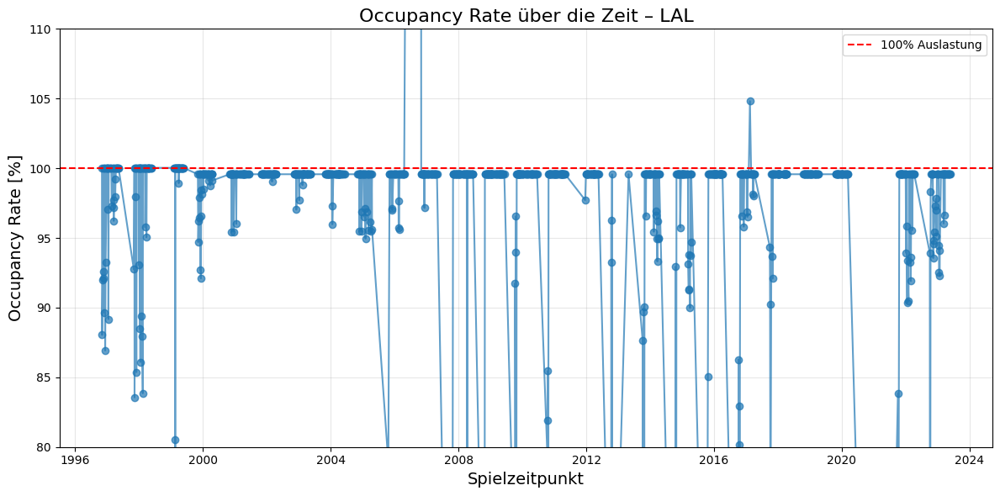

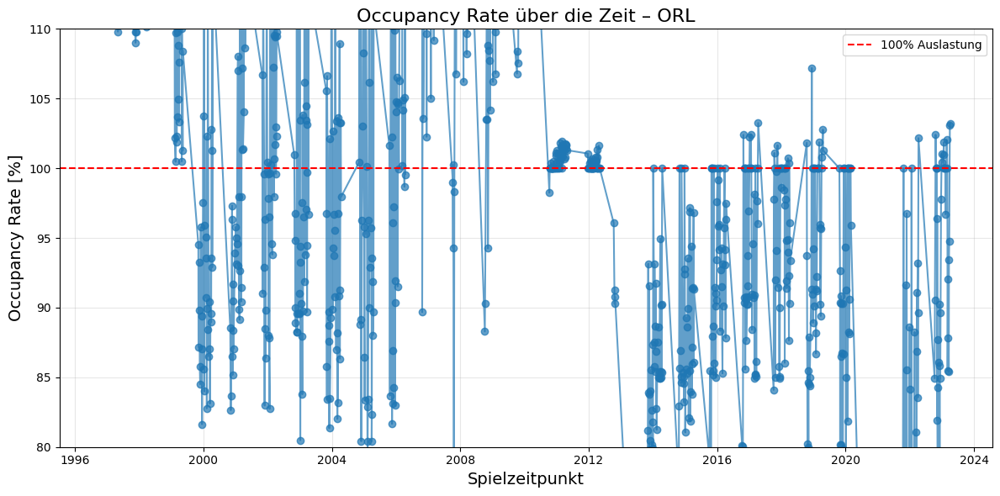

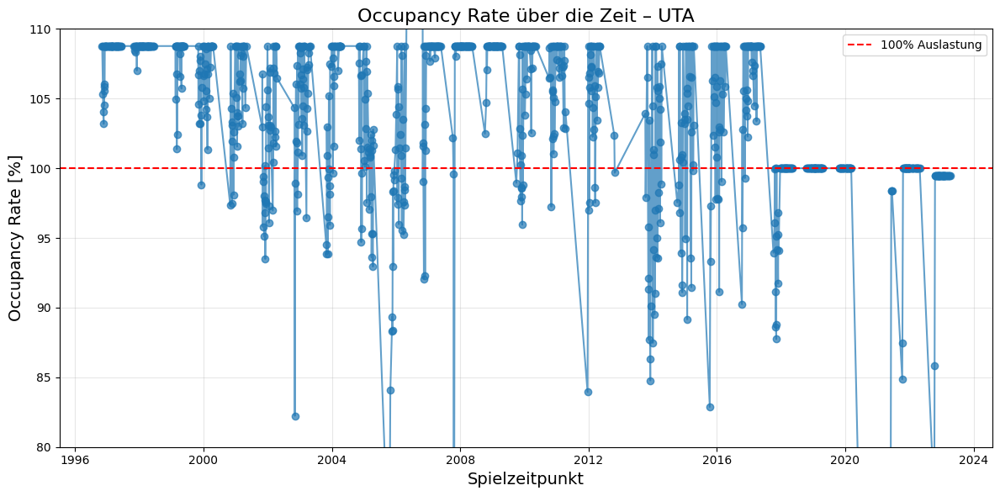

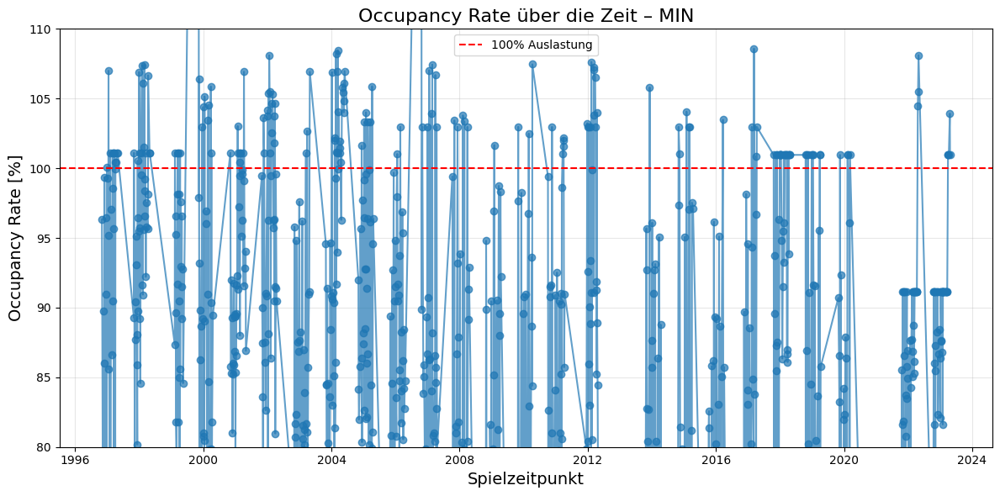

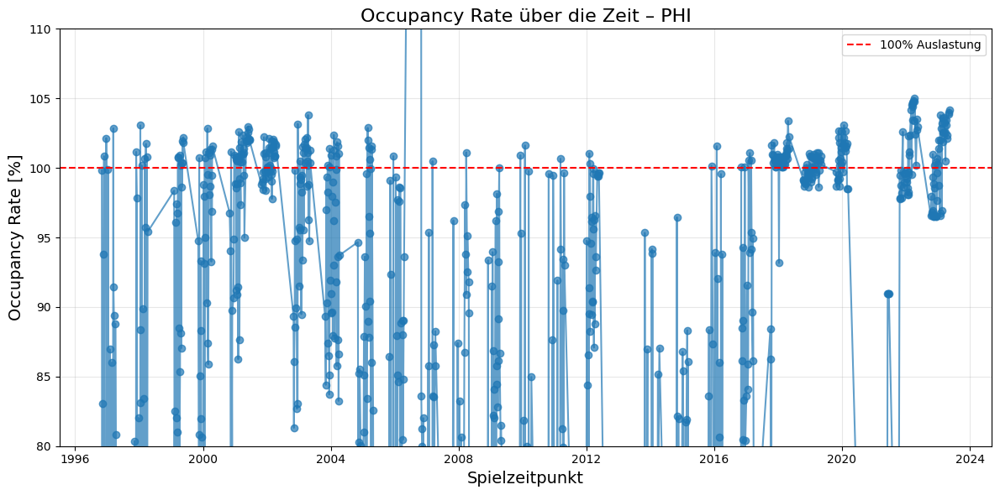

...

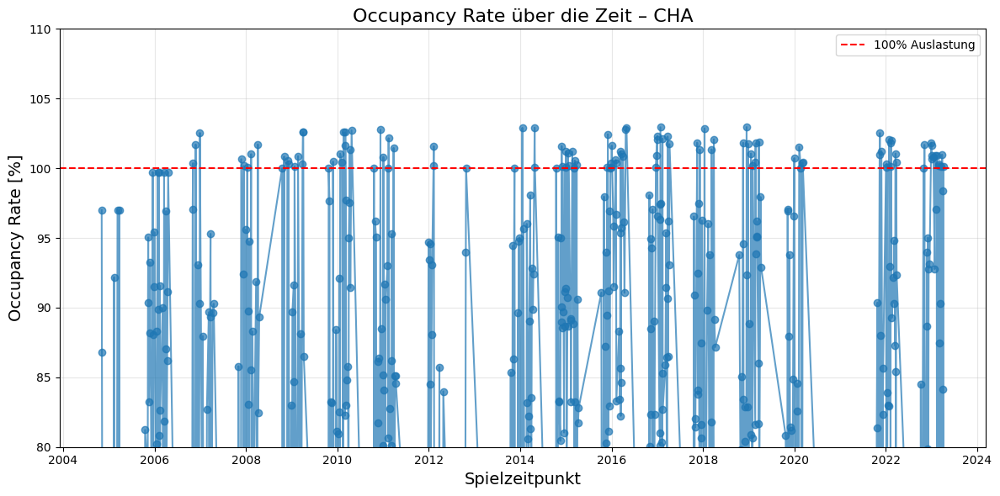

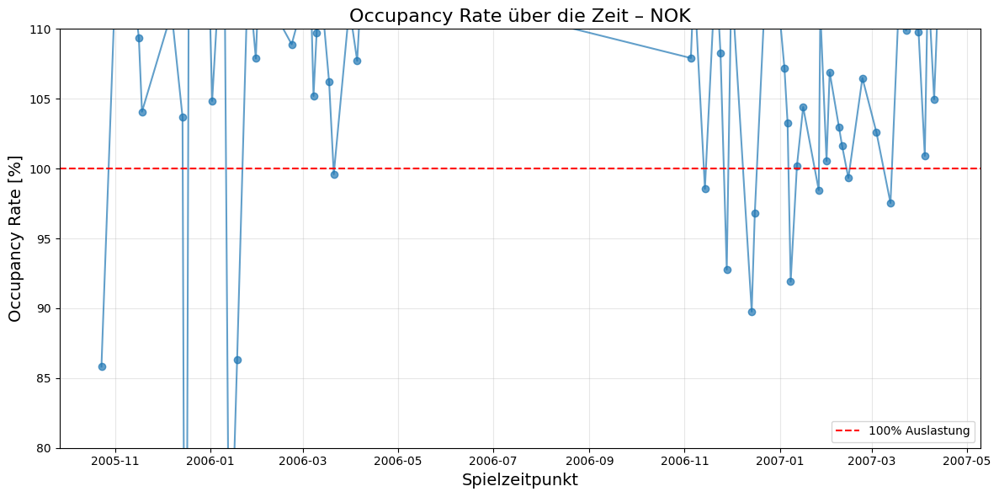

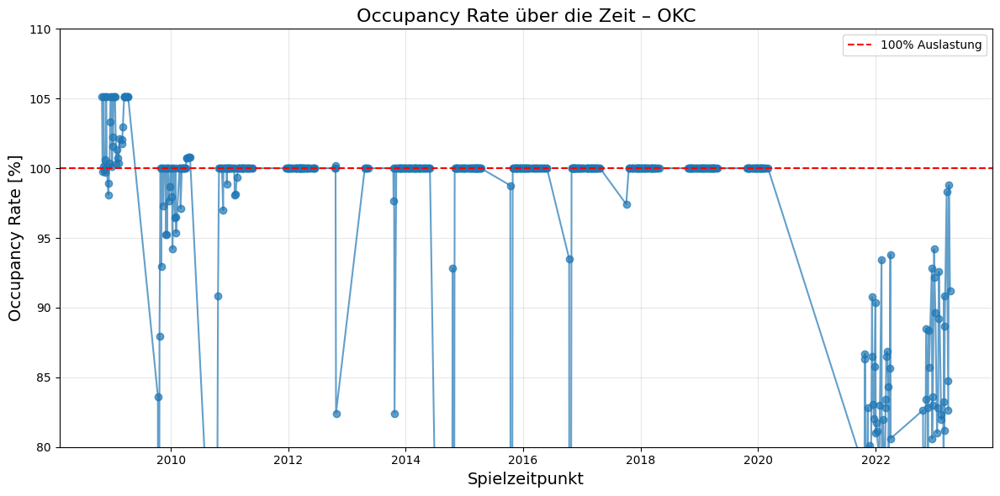

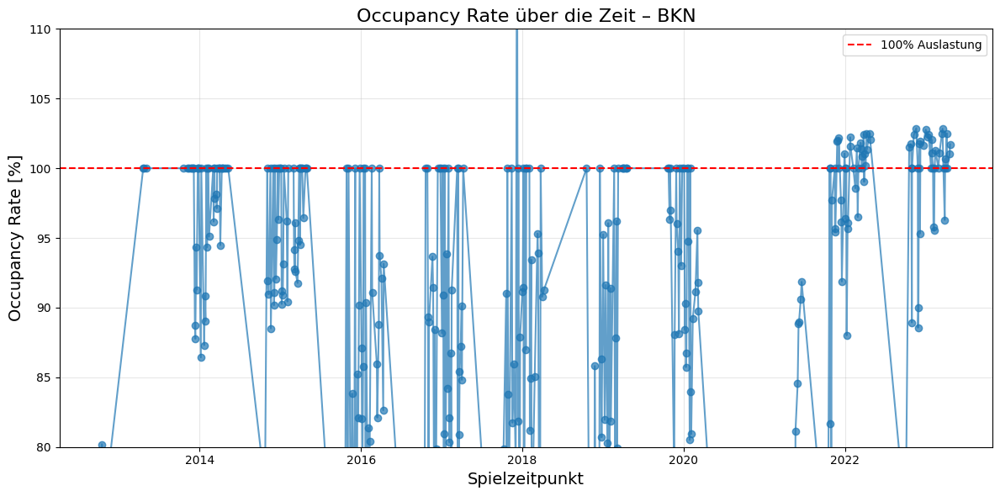

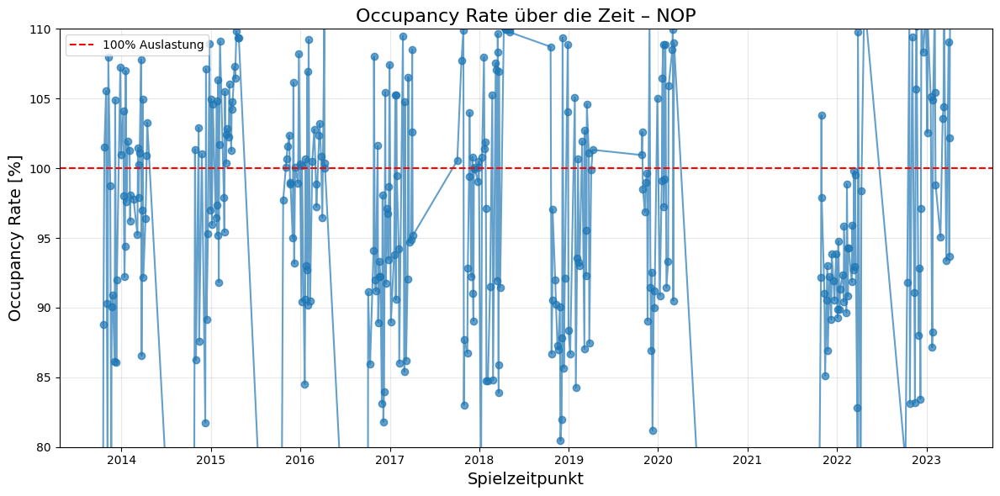

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Sicherstellen, dass occupancy_rate in Prozent vorliegt
# df['occupancy_rate_percent'] = df['occupancy_rate'] * 100

# Liste aller Heimteams
teams = df['team_abbreviation_home'].unique()

# Zeitachse sicherstellen
df['game_date'] = pd.to_datetime(df['game_date'])

# Sortieren für saubere Linien
df = df.sort_values('game_date')

# Plot für jedes Team
for team in teams:
    team_data = df[df['team_abbreviation_home'] == team]
    
    plt.figure(figsize=(12, 6))
    plt.plot(team_data['game_date'], team_data['occupancy_rate'], marker='o', linestyle='-', alpha=0.7)
    plt.axhline(100, color='red', linestyle='--', label='100% Auslastung')  # Referenzlinie bei 100%
    
    plt.title(f'Occupancy Rate über die Zeit – {team}', fontsize=16)
    plt.xlabel('Spielzeitpunkt', fontsize=14)
    plt.ylabel('Occupancy Rate [%]', fontsize=14)
    plt.ylim(80, 110)  # Optional: Y-Achse auf sinnvollen Bereich begrenzen
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()
